# I. Set Up

In [1]:
# PYTHON Imports 
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import math
import statistics
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D
from pathlib import Path
import glob
import os
import ipywidgets as widgets
from IPython.display import clear_output
import sys
import time
import json
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
import umap
import seaborn as sns
import fnmatch
# ASTROPHY Imports
import astropy 
from astropy.table import Table
from astropy.io import fits
from sherpa.astro import ui
# CIAO Imports
import ciao_contrib.runtool
from ciao_contrib.runtool import *
# CUSTOM Imports
from data_extraction_functions import *
from data_exploration_functions import *
from data_representation_functions import *

# Specify global path
global_path = '/Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets'
global_folders = list_folders_fun(global_path)

# Custom object hook to convert lists of lists to NumPy arrays
def numpy_hook(obj):
    if isinstance(obj, list):
        # Check if the list contains sublists (i.e. a matrix)
        if isinstance(obj[0], list):
            # Convert the list of lists to a NumPy array matrix
            return np.array(obj)
    # Return all other objects as is
    return obj

# Select dataset
set_widget = widgets.Dropdown(options=global_folders[:],value=global_folders[0],description='Set :',disabled=False); set_widget

2023-05-02 17:47:58.279251: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Dropdown(description='Set :', options=('Full', 'All', 'Full_extra', 'New', 'Bona'), value='Full')

# II. Load Data

In [2]:
# Set ID
set_id = set_widget.value
files = os.listdir(f'{global_path}/{set_id}/')
input_files = [f for f in files if fnmatch.fnmatch(f, 'hist*nE16*none*.pkl')]
input_widget = widgets.Dropdown(options=input_files[:],value=input_files[0],description='Histogram File :',disabled=False); input_widget

Dropdown(description='Histogram File :', options=('hist2D-Full-nE16-nt24-normnone.pkl', 'hist3D-Full-nE16-nt24…

In [12]:
# Load the DataFrame from the CSV file
input_file = input_widget.value
# Load histogram dictionary
with open(f'{global_path}/{set_id}/{input_file}', 'rb') as f:
    hist_dict = pickle.load(f)
# Flatten histograms in the dictionary and get IDs
ids = hist_dict.keys()
histograms = hist_dict.values()
features = np.array([np.array(h).flatten() for h in histograms])
features[np.isnan(features)] = 0.0
# Load properties
df_properties_input = pd.read_csv(f'{global_path}/{set_id}/properties-input-{set_id}.csv')
df_properties_input = df_properties_input[df_properties_input['obsreg_id'].isin(list(ids))]
df_properties = df_properties_input.drop_duplicates('obsreg_id', keep='first').reset_index()
#Load eventfiles
df_eventfiles_input = pd.read_csv(f'{global_path}/{set_id}/eventfiles-input-{set_id}.csv')
df_properties_global = pd.read_csv(f'{global_path}/{set_id}/properties-{set_id}.csv')
df_properties_global['obsreg_id'] = df_properties_global['obsid'].astype(str) + '_' + df_properties_global['region_id'].astype(str)
df_eventfiles_group = df_eventfiles_input.groupby('obsreg_id')
df_properties_group = df_properties_input.groupby('obsreg_id')

# print("Number of Eventfiles: ", df_eventfiles_group.ngroups)
# print("Number of Property Sets: ", df_properties_group.ngroups)

# Print eventfiles and properties number of IDs
print("Number of Features: ", len(features))
print("Number of Property Sets: ", len(df_properties))
print("Number of Full Property Sets: ", len(df_properties_global))

df_properties_global.head()

Number of Features:  95473
Number of Property Sets:  95473
Number of Full Property Sets:  130232


,name,ra,dec,err_ellipse_r0,err_ellipse_r1,err_ellipse_ang,significance,likelihood_class,conf_flag,sat_src_flag,...,hard_hs_hilim,var_prob_b,var_prob_h,var_prob_m,var_prob_s,var_index_b,var_index_w,livetime,detector,obsreg_id
0,2CXO J000000.5-575830,0.002735,-57.975181,2.819565,1.667655,91.090421,8.522222,TRUE,True,False,...,-0.267958,0.085129,0.121377,0.376451,0.175421,0.0,NaN,30146.733203,ACIS-6,9335_26
1,2CXO J000001.7+003824,0.007280,0.640146,1.093394,0.871849,104.849964,5.485207,TRUE,False,False,...,0.269207,0.612624,0.585561,0.519756,0.678199,1.0,NaN,23719.527217,ACIS-7,11591_1
2,2CXO J000002.4+004444,0.010189,0.745732,0.746484,0.723548,34.468703,5.774224,TRUE,False,False,...,0.003123,0.425172,0.465109,0.489993,0.754087,0.0,NaN,23719.527217,ACIS-7,11591_22
3,2CXO J000002.4+321750,0.010280,32.297465,1.067836,0.944977,115.769199,5.028571,TRUE,False,False,...,0.222986,0.154076,0.177304,0.548595,NaN,0.0,NaN,24735.257397,ACIS-3,20515_8
4,2CXO J000002.9-350332,0.012314,-35.059185,0.855386,0.735828,172.590089,16.266113,TRUE,False,False,...,-0.377889,0.067012,0.113151,0.235485,0.080282,0.0,NaN,9937.243792,ACIS-6,15712_4


# III. Display

SHOW

In [90]:
# Load DBSCAN RESULT
files = os.listdir(f'{global_path}/{set_id}/')
dbscan_files = [f for f in files if fnmatch.fnmatch(f, 'DBSCANres*11*EPS2.1*MS22*csv')]
# dbscan_files = [f for f in files if fnmatch.fnmatch(f, 'DBSCANres*11*EPS1.65*MS28*csv')]
dbscan_widget = widgets.Dropdown(options=dbscan_files[:],value=dbscan_files[0],description='TSNE File :',disabled=False); dbscan_widget

Dropdown(description='TSNE File :', options=('DBSCANres-Full-tsne-Full-hist2D-Full-nE16-nt24-normnone-2D-perp3…

In [106]:
# Load the DataFrame from the CSV file
dbscan_file = dbscan_widget.value
df_tsne = pd.read_csv(f'{global_path}/{set_id}/{dbscan_file}')
df_tsne = df_tsne.sort_values(by='cluster', ascending=True) 

#####SELECTED ANOMALIES
flares_maybe = ['10542_331','10556_6687','10556_5752','10556_6687']
dips_maybe = ['13814_586','13813_218','13828_596']

# DIPS ET AL
parmar = ['10783_10','10871_10','11059_10','9070_10','9072_10'] # LMXB dips!
distefano = ['13814_567']
m101ulx = ['4736_81','6170_74','4733_229','4737_74','5300_95','5322_229','6152_81']

ieva = ['11272_13','13812_586','13812_218','9550_17','942_101','6152_79']

# FLARES ET AL 
lin = ['4062_31', '13454_56','20635_58'] 
lin = ['4062_31', '13454_56','20635_58','24604_8'] 
xue = ['957_208', '3389_274','15211_38','15214_29']
irwin = ['3926_13','7800_4','7799_16','8490_30']
glennie = ['12884_10']
jonker = ['803_90']
vasquez = ['2025_39','9546_17','9548_14','12264_54','15113_59','21831_22']
# vasquez = ['2025_39','9548_14','15113_59','21831_22']
nandra = ['9875_166', '9456_274', '5849_62']
goulding =['8636_2', '8636_3'] # last one not listed 2012 2015

flares = ['4395_992','16444_1025','13637_1078','14368_489','14368_503','10822_185','10955_21','10996_5','2833_53','13610_112','15214_29','1042_24']

NEW = ['23022_122']

tsne_lin = df_tsne.loc[df_tsne['obsreg_id'].isin(lin)]
tsne_irwin = df_tsne.loc[df_tsne['obsreg_id'].isin(irwin)]
tsne_glennie = df_tsne.loc[df_tsne['obsreg_id'].isin(glennie)]
tsne_jonker = df_tsne.loc[df_tsne['obsreg_id'].isin(jonker)]
tsne_vasquez = df_tsne.loc[df_tsne['obsreg_id'].isin(vasquez)]
tsne_xue = df_tsne.loc[df_tsne['obsreg_id'].isin(xue)]
tsne_goulding = df_tsne.loc[df_tsne['obsreg_id'].isin(goulding)]
tsne_nandra = df_tsne.loc[df_tsne['obsreg_id'].isin(nandra)]
tsne_flares = df_tsne.loc[df_tsne['obsreg_id'].isin(flares + flares_maybe)]

tsne_m101ulx = df_tsne.loc[df_tsne['obsreg_id'].isin(m101ulx)]
tsne_distefano = df_tsne.loc[df_tsne['obsreg_id'].isin(distefano)]
tsne_moredips = df_tsne.loc[df_tsne['obsreg_id'].isin(ieva + dips_maybe)]
tsne_parmar = df_tsne.loc[df_tsne['obsreg_id'].isin(parmar)] # LMXB

tsne_new = df_tsne.loc[df_tsne['obsreg_id'].isin(NEW)] 


anomalies = pd.concat([tsne_lin,tsne_irwin,tsne_glennie,tsne_jonker,tsne_vasquez,tsne_xue,tsne_goulding,tsne_nandra,tsne_flares,tsne_m101ulx, tsne_distefano, tsne_moredips,tsne_parmar,tsne_new])
anomalies.head(50)

,tsne1,tsne2,obsreg_id,cluster
63365,11.648593,-23.330715,4062_31,0
45857,-28.072298,-11.460133,20635_58,0
53872,-27.825262,-13.099569,24604_8,0
14036,11.277117,-27.721266,13454_56,0
10836,-37.902790,-3.515931,12884_10,20
86304,-38.693733,10.275306,803_90,0
92667,20.690426,3.006091,9546_17,0
92694,27.814730,-16.474604,9548_14,0
23967,11.962671,-17.199892,15113_59,0
8513,12.302959,-16.327927,12264_54,0


[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]


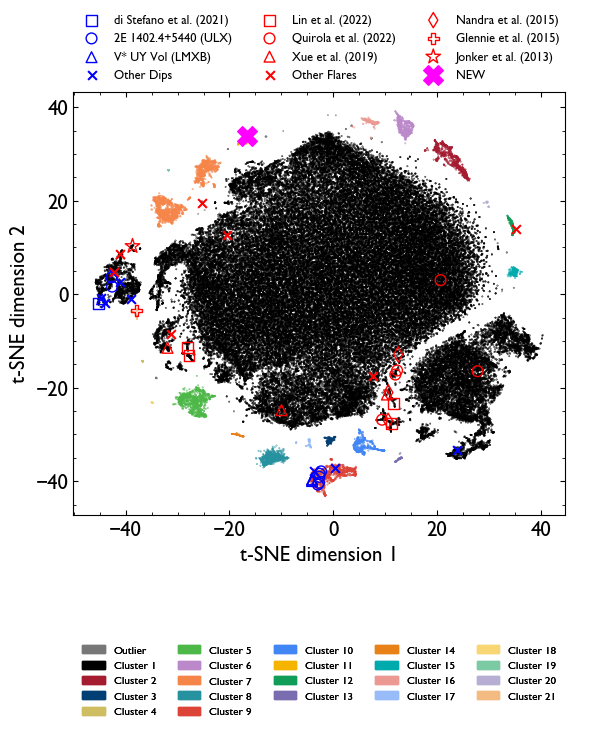

In [116]:
# PLOT
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

imperial = '#003E74'
harvard = '#A51C30'
silver = '#777777'
gold = '#cfbd62'
h_green = "#4db848"
# h_green = "#66A40A"
# h_green = "#205527"

h_orange = "#f58549"
h_purple = "#bb89ca"
h_turq = "#00aaad"
# gold = '#dfc16d'

# Define Colour Scheme
google_blue = '#4285F4'
google_red = '#DB4437'
google_yellow = '#F4B400'
google_green = '#0F9D58'
google_purple = '#7A6DAF'
google_orange = '#E98119' ##EB8B14
google_turq = '#26929F'
light_blue = '#98BCF9'
light_red = '#EB9992'
light_yellow = '#F9D674'
light_green = '#7CCAA4'
light_purple = '#B6AFD3'
light_orange = '#F3BA82'
light_turq = '#89C4CB'
dark_blue = '#244985'
dark_red = '#8B2B23'
dark_yellow = '#B18300'
dark_green = '#0A6438'
dark_purple = '#4E456F'
dark_orange = '#945210' 
dark_turq = '#185D65'
grey_blue = '#5A7FBB'
grey_red = '#AE5B54'
grey_yellow = '#BB9836'
grey_green = '#3E8C66'
grey_purple = '#787290'
grey_orange = '#B57C44'
grey_turq = '#4B868D'


colors = [silver,'black',harvard,imperial,gold,h_green,h_purple,h_turq,google_red,google_blue,google_yellow,google_green,google_purple,google_orange,google_turq, light_red, light_blue,light_yellow, light_green, light_purple, light_orange, light_turq, dark_red,dark_blue, dark_yellow, dark_green, dark_purple, dark_orange, dark_turq]
colors = [silver,'black',harvard,imperial,h_green,gold,h_purple,h_turq,google_red,google_blue,google_green,google_yellow,google_purple,google_orange,google_turq, light_red, light_blue,light_green,light_yellow,  light_purple, light_orange, light_turq, dark_red,dark_blue,  dark_green,dark_yellow, dark_purple, dark_orange, dark_turq]
colors = [silver,'black',harvard,imperial,gold,h_green,h_purple,h_orange,google_turq,google_red,google_blue,google_yellow,google_green,google_purple,google_orange,h_turq, light_red, light_blue,light_yellow,light_green,  light_purple, light_orange, light_turq, dark_red,dark_blue, dark_yellow,  dark_green, dark_purple, dark_orange, dark_turq, 'red', 'blue', 'yellow', 'green', 'orange', 'magenta','cyan','brown','navy','gold','forestgreen']
# colors = ['black',harvard,imperial,gold,h_green,h_purple,h_orange,google_turq,google_red,google_blue,google_yellow,google_green,google_purple,google_orange,h_turq, light_red, light_blue,light_yellow,light_green,  light_purple, light_orange, light_turq, dark_red,dark_blue, dark_yellow,  dark_green, dark_purple, dark_orange, dark_turq, 'red', 'blue', 'yellow', 'green', 'orange', 'magenta','cyan','brown','navy','gold','forestgreen']

cmap = ListedColormap(colors[:len(df_tsne['cluster'].unique())])
# cmap = plt.get_cmap('tab20b', len)

# Create custom legend handles for clusters
unique_labels = df_tsne['cluster'].unique()
print(unique_labels)
cluster_legend_handles = []
for i in range(len(unique_labels)):
    if i > 0:
        label = 'Cluster ' + str(unique_labels[i]+1)
        color = colors[i % len(colors)]
        cluster_legend_handles.append(mpatches.Patch(color=color, label=label))
    else:
        label = 'Outlier'
        color = colors[i % len(colors)]
        cluster_legend_handles.append(mpatches.Patch(color=color, label=label))

# Define Font Settings
plt.rcParams.update({'font.size': 15})
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Gill Sans'
fig, axs = plt.subplots(figsize=(6, 6),tight_layout = True)
plt.subplots_adjust(bottom=0.5, right=1, top=1)

cluster = axs.scatter(df_tsne['tsne1'], df_tsne['tsne2'], s=0.1, c=df_tsne['cluster'], cmap=cmap)
axs.set_xlabel('t-SNE dimension 1')
axs.set_ylabel('t-SNE dimension 2')

markersize = 40
c_f = 'red'
c_d = 'blue'

axs.scatter(tsne_distefano['tsne1'], tsne_distefano['tsne2'], edgecolors=c_d, marker='s', s=markersize*1.5, facecolor='none', label='di Stefano et al. (2021)')
axs.scatter(tsne_m101ulx['tsne1'], tsne_m101ulx['tsne2'], edgecolors=c_d, marker='o', s=markersize*1.5, facecolor='none', label='2E 1402.4+5440 (ULX)')
axs.scatter(tsne_parmar['tsne1'], tsne_parmar['tsne2'], edgecolors=c_d, marker='^', s=markersize*1.5, facecolor='none', label='V* UY Vol (LMXB)')
axs.scatter(tsne_moredips['tsne1'], tsne_moredips['tsne2'], c=c_d, marker='x', s=markersize*1, facecolor='none', label='Other Dips')
 
axs.scatter(tsne_lin['tsne1'], tsne_lin['tsne2'], edgecolors=c_f, marker='s', s=markersize*1.5, facecolor='none', label='Lin et al. (2022)')
axs.scatter(tsne_vasquez['tsne1'], tsne_vasquez['tsne2'], edgecolors=c_f, marker='o', s=markersize*1.5, facecolors='none', label='Quirola et al. (2022)')
axs.scatter(tsne_xue['tsne1'], tsne_xue['tsne2'], edgecolors=c_f, marker='^', s=markersize*1.5, facecolor='none', label='Xue et al. (2019)')
axs.scatter(tsne_flares['tsne1'], tsne_flares['tsne2'], c=c_f, marker='x', s=markersize*1, facecolor='none', label='Other Flares')
axs.scatter(tsne_nandra['tsne1'], tsne_nandra['tsne2'], edgecolors=c_f, marker='d', s=markersize*1.5, facecolor='none', label='Nandra et al. (2015)')
axs.scatter(tsne_glennie['tsne1'], tsne_glennie['tsne2'], edgecolors=c_f, marker='P', s=markersize*1.5, facecolor='none', label='Glennie et al. (2015)')
axs.scatter(tsne_jonker['tsne1'], tsne_jonker['tsne2'], edgecolors=c_f, marker='*', s=markersize*3, facecolor='none', label='Jonker et al. (2013)')


axs.scatter(tsne_new['tsne1'], tsne_new['tsne2'], c='magenta', marker='X', s=markersize*5, facecolor='none', label='NEW')


axs.grid(False) 
axs.minorticks_on()
axs.tick_params(which='both', direction='in', top=True, right=True)
anomaly_legend = axs.legend(loc='upper center', bbox_to_anchor=(0.5, 1.21),
          ncol=3, frameon = False,fontsize=9)
# axs.legend(loc='upper right', bbox_to_anchor=(1., 1),frameon = False,fontsize=12)
# plt.tight_layout()




# axs.set_title(dbscan_file)
axs.set_title('ccdfdftverjrvennkkbhnbnhkhhhjhhhhkhkvkh;vdbgb \n ccdfdftvevkervwrbgb \n weqgf1wqrger',c='white', loc='left')
# Combine both legends into a single legend
cluster_legend = axs.legend(handles=cluster_legend_handles, bbox_to_anchor=(0.5, -0.39), loc='lower center', ncol=5, frameon = False,fontsize=8) # 3D 
cluster_legend = axs.legend(handles=cluster_legend_handles, bbox_to_anchor=(0.5, -0.5), loc='lower center', ncol=5, frameon = False,fontsize=8) # 2D

plt.figtext(0.5, -0.23, "one text and next text", ha="center", fontsize=10, bbox={"facecolor":"white", "alpha":0.0, "pad":30, "edgecolor":"white"}, c='white') 

# Add both legends to the plot
axs.add_artist(cluster_legend)
axs.add_artist(anomaly_legend)

plt.show()


Box

-38.693733 10.275306


Text(0.5, 1.0, 'DBSCANres-Full-tsne-Full-hist2D-Full-nE64-nt64-normnone-2D-perp30-lr80-ee1-it1500-initrandom-PCA24-rs11.csv-EPS2.1-MS22.csv')

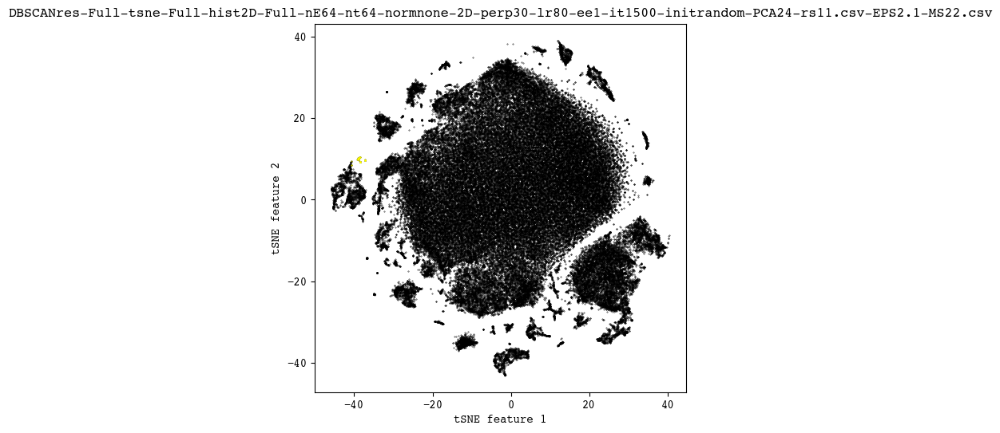

In [111]:
box_size = 2

# box = anomalies[anomalies['obsreg_id']=='17743_278']
box = df_tsne[df_tsne['obsreg_id']=='803_90']
x0, y0 = box[['tsne1']].values[0][0], box[['tsne2']].values[0][0]
print(x0, y0)
xmin, xmax = x0 - box_size, x0 + box_size
ymin, ymax = y0 - box_size, y0 + box_size
points_in_box = df_tsne[(df_tsne['tsne1'] >= xmin) & (df_tsne['tsne1'] <= xmax) & (df_tsne['tsne2'] >= ymin) & (df_tsne['tsne2'] <= ymax)]
potential_anomalies2 = points_in_box['obsreg_id']
df_properties_anomalies2 = df_properties_global[df_properties_global['obsreg_id'].isin(potential_anomalies2)]

fig, axs = plt.subplots(1, 1, figsize=(6, 6))
plt.rcParams.update({'font.size': 10})
plt.rcParams['font.monospace'] = "Courier"
plt.rcParams["font.family"] = "monospace"
rej = axs.scatter(df_tsne['tsne1'], df_tsne['tsne2'], s=0.1, c='black', label = 'Rejected Clusters')
acc = axs.scatter(points_in_box['tsne1'], points_in_box['tsne2'], s=0.1, c='yellow', label = 'Chosen Clusters')
axs.set_xlabel('tSNE feature 1')
axs.set_ylabel('tSNE feature 2')
axs.set_title(dbscan_file)

Cluster

219


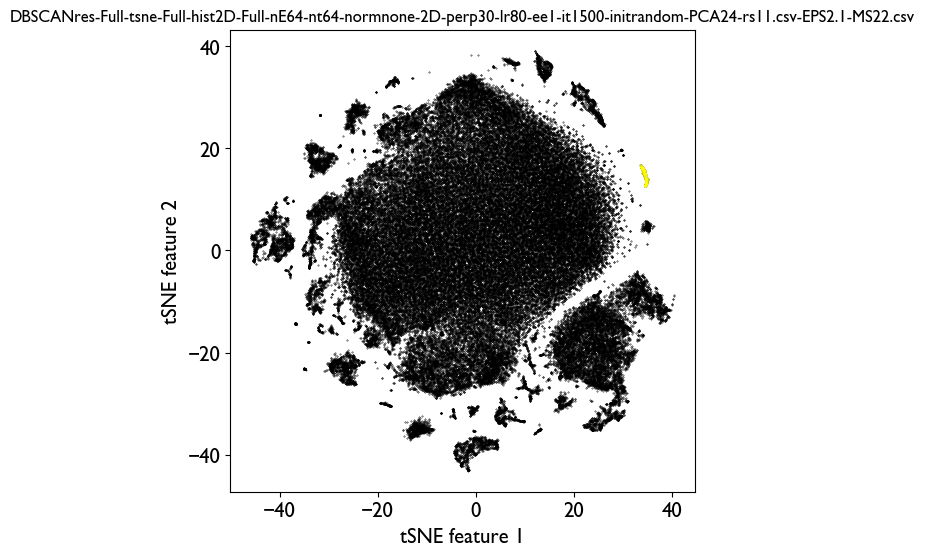

In [117]:
clust = [12]
select_clusters = [num - 1 for num in clust]
df_select = df_tsne[df_tsne['cluster'].isin(select_clusters)]
# df_select = df_tsne[~df_tsne['cluster'].isin(select_clusters)]
potential_anomalies = df_select['obsreg_id']

df_properties_anomalies = df_properties_global[df_properties_global['obsreg_id'].isin(potential_anomalies)]

# df_properties_anomalies  = df_properties_anomalies[df_properties_anomalies['var_prob_b'] > 0.5]
# df_select = df_select[(df_select['tsne1'] >= 65) & (df_select['tsne1'] <= 69) & (df_select['tsne2'] >= -6) & (df_select['tsne2'] <= -5)]

# df_properties_anomalies.head(500)
# 67.453880	-5.705921	4062_31	3
# df_select = df_select[(df_select['tsne1'] >= 90) & (df_select['tsne1'] <= 95) & (df_select['tsne2'] >= 0.5) & (df_select['tsne2'] <= 1)]


fig, axs = plt.subplots(1, 1, figsize=(6, 6))
plt.rcParams.update({'font.size': 10})
plt.rcParams['font.monospace'] = "Courier"
plt.rcParams["font.family"] = "monospace"
rej = axs.scatter(df_tsne['tsne1'], df_tsne['tsne2'], s=0.1, c='black', label = 'Rejected Clusters')
acc = axs.scatter(df_select['tsne1'], df_select['tsne2'], s=0.1, c='yellow', label = 'Chosen Clusters')
axs.set_xlabel('tSNE feature 1')
axs.set_ylabel('tSNE feature 2')


axs.set_title(dbscan_file)

print(len(potential_anomalies))
# normal_ids = list(potential_anomalies)
# with open(f'{global_path}/{set_id}/normal_ids_2D.pkl', 'wb') as f:
#     # Write the list to the file using pickle
#     pickle.dump(normal_ids , f)

In [8]:
# 6. Lightcurve Plotter Function
def lightcurveplotterNEW(df_eventfiles_input,id_name,bin_size_sec,hr_window=10,bb_p0 = 0.1,band_errors = True):
    """
    DESCRIPTION: Plots lightcurves and cumulative counts for given eventfile input dataframe
    INPUT: 1. Original eventfile table, 2. Original properties table, 3. Global Path, 4. Set Name
    OUTPUT: 1. Reduced eventfile table, 2. Reduced properties table
    """
    # Define Colour Scheme
    google_blue = '#4285F4'
    google_red = '#DB4437'
    google_yellow = '#F4B400'
    google_green = '#0F9D58'
    google_purple = '#6f2da8'
    # Define Font Settings
    plt.rcParams.update({'font.size': 9})
    plt.rcParams['font.sans-serif'] = 'Helvetica'
    plt.rcParams['font.family'] = 'sans-serif'
    # Create subplots 
    fig, axs = plt.subplots(5, 1, figsize=(6, 12),constrained_layout = True)
    fig.suptitle(f'ObsRegID: {id_name}',fontweight="bold")
    # Prepare df
    df = df_eventfiles_input.copy()
    df['time'] = df_eventfiles_input['time'] - min(df_eventfiles_input['time'])
    df = df.sort_values(by='time') 
    df = df.reset_index(drop=True)
    # Create binned lightcurve
    df_binned = df.groupby(df['time'] // bin_size_sec * bin_size_sec).agg(
        broad_count = ('energy', lambda x: ((x >= 500) & (x <= 7000)).sum()),
        soft_count =('energy', lambda x: ((x >= 500) & (x < 1200)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()))
    # Plot binned lightcurve
    axs[0].plot(df_binned.index/1000, df_binned['broad_count'], color = google_blue, marker = 'o', markerfacecolor = 'black', markersize = 4)
    axs[0].set_xlabel('Time [ks]')
    axs[0].set_ylabel('Counts per Bin')
    axs[0].set_title(f'Lightcurve with {bin_size_sec}s Bin Size')
    axs[0].set_xlim([0,max(df["time"]/1000)])
    # Create rolling 3-bin averaged lightcurved
    df_rolling = df_binned.rolling(window=3, center=True).mean()
    rolling_std = df_binned.rolling(window=3, center=True).std()
    errors = rolling_std['broad_count']/math.sqrt(3)
    errors.iloc[0] = errors.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors.iloc[-1] = errors.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_h = rolling_std['hard_count']/math.sqrt(3)
    errors_h.iloc[0] = errors_h.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_h.iloc[-1] = errors_h.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_m = rolling_std['medium_count']/math.sqrt(3)
    errors_m.iloc[0] = errors_m.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_m.iloc[-1] = errors_m.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_s = rolling_std['soft_count']/math.sqrt(3)
    errors_s.iloc[0] = errors_s.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_s.iloc[-1] = errors_s.iloc[-1] * math.sqrt(3)/math.sqrt(2)
    # Plot rolling 3-bin averaged lightcurved
    axs[1].plot(df_rolling.index/1000, df_rolling['broad_count'], color = google_red)
    axs[1].errorbar(df_rolling.index/1000, df_rolling['broad_count'], yerr = errors, xerr = None,fmt ='.',color = "black",linewidth = .5,capsize = 1)
    axs[1].set_xlabel('Time [ks]')
    axs[1].set_ylabel('Counts per Bin')
    axs[1].set_title('Running Average of 3 Bins')
    axs[1].set_xlim([0,max(df["time"]/1000)])
    # Create cumulative count plot
    df_cumulative = df.copy()
    df_cumulative['count'] = 1
    df_cumulative['cumulative_count'] = df_cumulative['count'].cumsum()
    # Create a BB plot
    bb_bins = astats.bayesian_blocks(df['time'].values/1000, fitness='events',p0 = bb_p0) # p0 = 0.01 or so BASED ON VINAY ! 6?
    bin_widths = bb_bins[1:] - bb_bins[:-1]
    counts, bins =  np.histogram(df['time']/1000, bins=bb_bins)
    countrate = counts/bin_widths 
    bin_centers = (bb_bins[:-1] + bb_bins[1:]) / 2
    axs[3].step(bb_bins, np.append(countrate, countrate[-1]), where='post', color='black')
    axs[3].set_xlim([0,max(df["time"]/1000)])
    # axs[3].set_xlim(axs[1].get_xlim())
    axs[3].set_xlabel('Time [ks]')
    axs[3].set_ylabel('Count Rate')
    axs[3].set_title(f'Bayesian Blocks Count Rate (p0 = {bb_p0})')
    # Create a Energy Band Plot
    axs[2].plot(df_rolling.index/1000, df_rolling['hard_count'], color = google_blue, label='Hard')
    axs[2].plot(df_rolling.index/1000, df_rolling['medium_count'], color = google_green, label='Medium')
    axs[2].plot(df_rolling.index/1000, df_rolling['soft_count'], color = google_red, label='Soft')
    if band_errors == True:
        axs[2].errorbar(df_rolling.index/1000, df_rolling['hard_count'], yerr = errors_h, xerr = None,fmt ='.',color = google_blue,linewidth = 1,capsize = 2)
        axs[2].errorbar(df_rolling.index/1000, df_rolling['medium_count'], yerr = errors_m, xerr = None,fmt ='.',color = google_green,linewidth = 1,capsize = 2)
        axs[2].errorbar(df_rolling.index/1000, df_rolling['soft_count'], yerr = errors_s, xerr = None,fmt ='.',color = google_red,linewidth = 1,capsize = 2)
    axs[2].set_xlim([0,max(df_binned.index/1000)])
    # axs[3].set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
    axs[2].set_ylabel('Counts')
    axs[2].set_xlabel('Time [ks]')
    axs[2].set_title(f'Energy Bands with {bin_size_sec}s Bin Size - Running Avg')
    axs[2].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)

    # # Create HR 
    # # Compute the counts for each energy band
    # df['soft_count'] = ((df['energy'] >= 500) & (df['energy'] < 1200)).rolling(hr_window).sum()
    # df['medium_count'] = ((df['energy'] >= 1200) & (df['energy'] < 2000)).rolling(hr_window).sum()
    # df['hard_count'] = ((df['energy'] >= 2000) & (df['energy'] <= 7000)).rolling(hr_window).sum()
    # df[['soft_count', 'medium_count','hard_count']] = df[['soft_count', 'medium_count','hard_count']].shift(-math.floor(hr_window/2))
    # # Compute the HR ratios using the counts
    # df['HR_hs'] = (df['hard_count'] - df['soft_count']) / (df['hard_count'] + df['soft_count'])
    # df['HR_hm'] = (df['hard_count'] - df['medium_count']) / (df['hard_count'] + df['medium_count'])
    # df['HR_ms'] = (df['medium_count'] - df['soft_count']) / (df['medium_count'] + df['soft_count'])

    # axs[4].plot(df["time"]/1000, df['HR_hs'], color = google_blue, label='H-S')
    # axs[4].plot(df["time"]/1000, df['HR_hm'], color = google_green, label='H-M')
    # axs[4].plot(df["time"]/1000, df['HR_ms'], color = google_red, label='M-S')
    # axs[4].set_xlim([0,max(df["time"]/1000)])
    # # axs[3].set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
    # axs[4].set_ylabel('HR')
    # axs[4].set_xlabel('Time [ks]')
    # axs[4].set_title(f'Running HR over {hr_window} counts')
    # axs[4].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)

    #Create BB HR
    df_hr_bb = df.copy()
    # compute photon counts in each bin
    df_hr_bb = df_hr_bb.groupby(pd.cut(df_hr_bb['time']/1000, bb_bins)).agg(
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        soft_count=('energy', lambda x: ((x >= 500) & (x < 1200)).sum())
    )
    df_hr_bb["bb_hs"] = (df_hr_bb['hard_count'] - df_hr_bb['soft_count']) / (df_hr_bb['hard_count'] + df_hr_bb['soft_count'])
    df_hr_bb["bb_hm"]  = (df_hr_bb['hard_count'] - df_hr_bb['medium_count']) / (df_hr_bb['hard_count'] + df_hr_bb['medium_count'])
    df_hr_bb["bb_ms"]  = (df_hr_bb['medium_count'] - df_hr_bb['soft_count']) / (df_hr_bb['medium_count'] + df_hr_bb['soft_count'])
    bb_hs = df_hr_bb["bb_hs"].values
    bb_hm = df_hr_bb["bb_hm"].values
    bb_ms = df_hr_bb["bb_ms"].values
    axs[4].step(bb_bins, np.append(bb_hs, bb_hs[-1]), where='post',color = google_blue, label='H-S')
    axs[4].step(bb_bins, np.append(bb_hm, bb_hm[-1]), where='post',color = google_green, label='H-M')
    axs[4].step(bb_bins, np.append(bb_ms, bb_ms[-1]), where='post',color = google_red, label='M-S')
    axs[4].set_xlim([0,max(df["time"]/1000)])
    # axs[5].set_xlim(axs[1].get_xlim())
    axs[4].set_ylabel('HR')
    axs[4].set_xlabel('Time [ks]')
    axs[4].set_title(f'Bayesian Blocks HR')
    axs[4].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)
    plt.show()
    return countrate 


Lightcurves

In [14]:
variability = df_properties_anomalies[df_properties_anomalies['var_index_b']>5]
print('var', len(variability)/len(df_properties_anomalies)*100, '%')

var 20.540327524301603 %


86
Name: 2CXO J190741.3+070651, ID: 1042-195, Date: 2001-09-06T05:52:17, Counts: 1675
RA  286.9222084326567 DEC  7.114176359970011
varB  0.93 varH  0.97 varM  0.51 varS  nan varINDEX  6.0


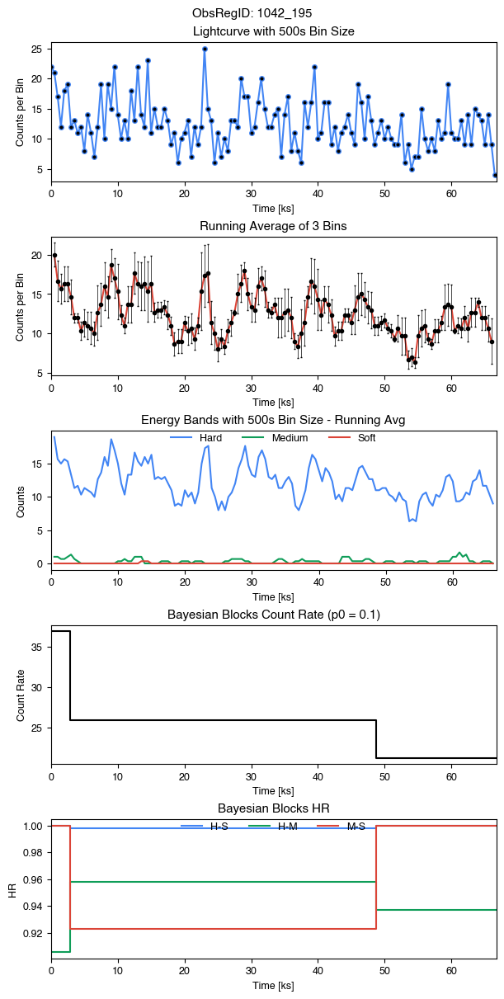

Name: 2CXO J225355.0+624337, ID: 10811-223, Date: 2009-04-28T07:24:32, Counts: 1592
RA  343.4794455882512 DEC  62.72695832664228
varB  1.0 varH  1.0 varM  0.91 varS  0.24 varINDEX  9.0


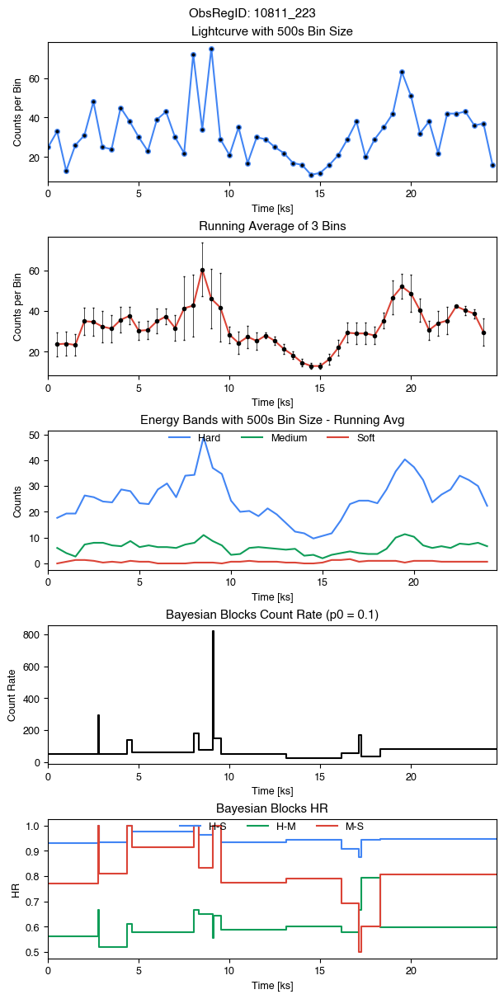

Name: 2CXO J225355.0+624337, ID: 10812-223, Date: 2009-05-03T02:14:14, Counts: 1347
RA  343.4794455882512 DEC  62.72695832664228
varB  1.0 varH  1.0 varM  0.08 varS  0.94 varINDEX  8.0


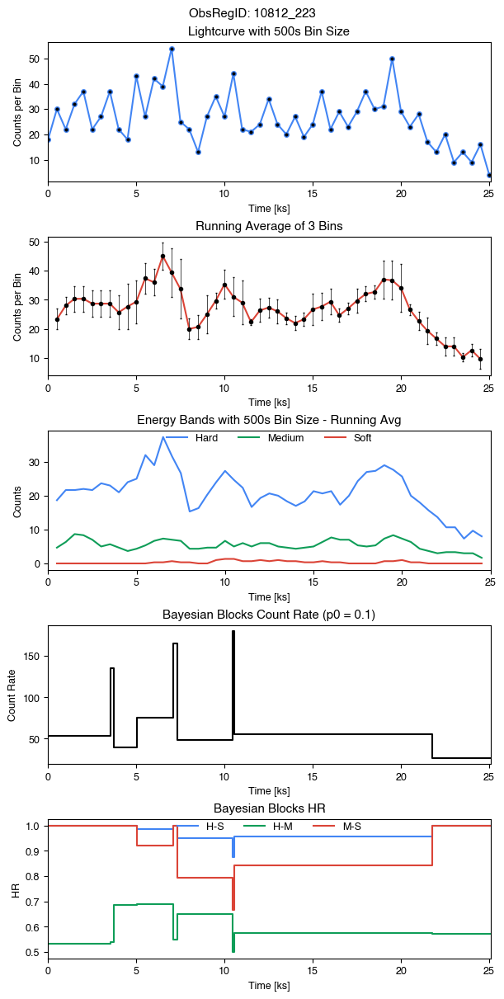

Name: 2CXO J183002.5-020257, ID: 11013-79, Date: 2010-06-07T23:55:48, Counts: 962
RA  277.5108316207384 DEC  -2.04921081181354
varB  1.0 varH  1.0 varM  0.83 varS  nan varINDEX  10.0


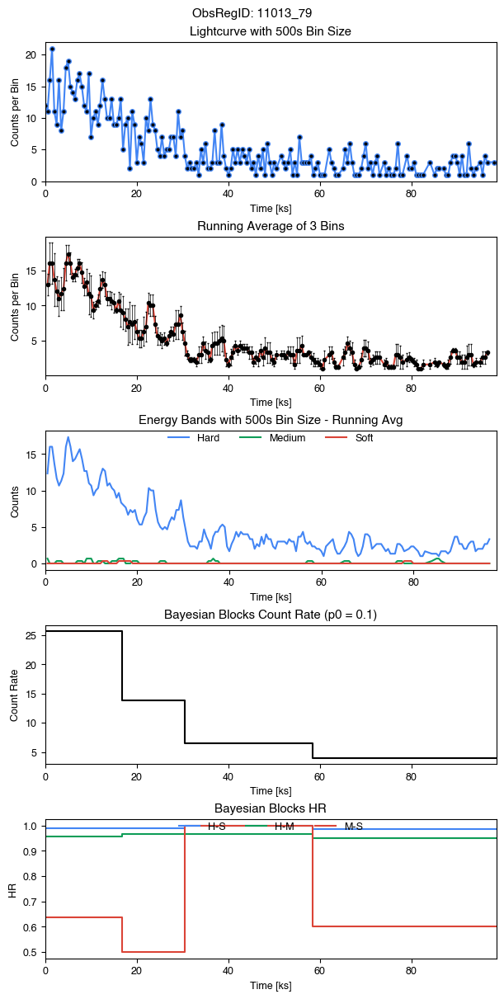

Name: 2CXO J181837.9-170248, ID: 12348-365, Date: 2011-07-30T15:17:01, Counts: 3085
RA  274.6579043815957 DEC  -17.046650209071576
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


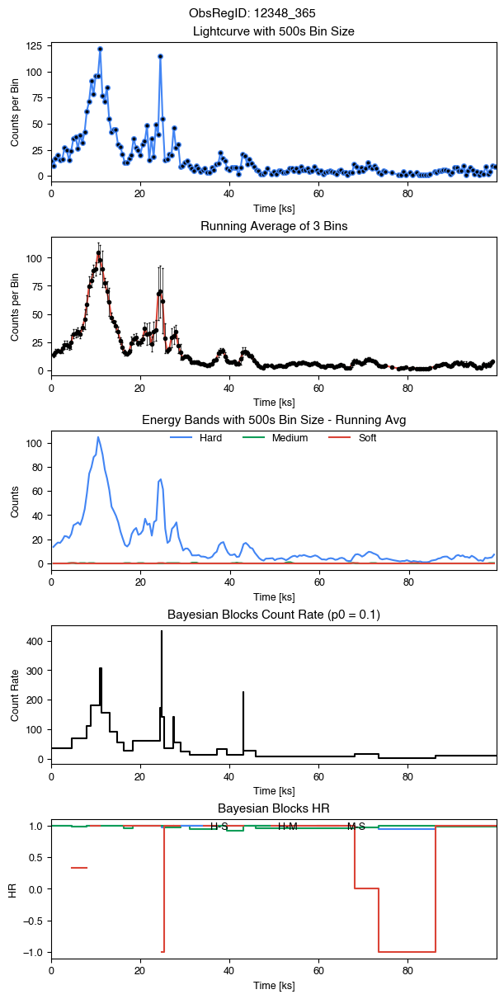

Name: 2CXO J163905.4-464212, ID: 12511-44, Date: 2011-06-17T11:26:08, Counts: 5382
RA  249.77278767919395 DEC  -46.70356333827938
varB  1.0 varH  1.0 varM  0.53 varS  nan varINDEX  8.0


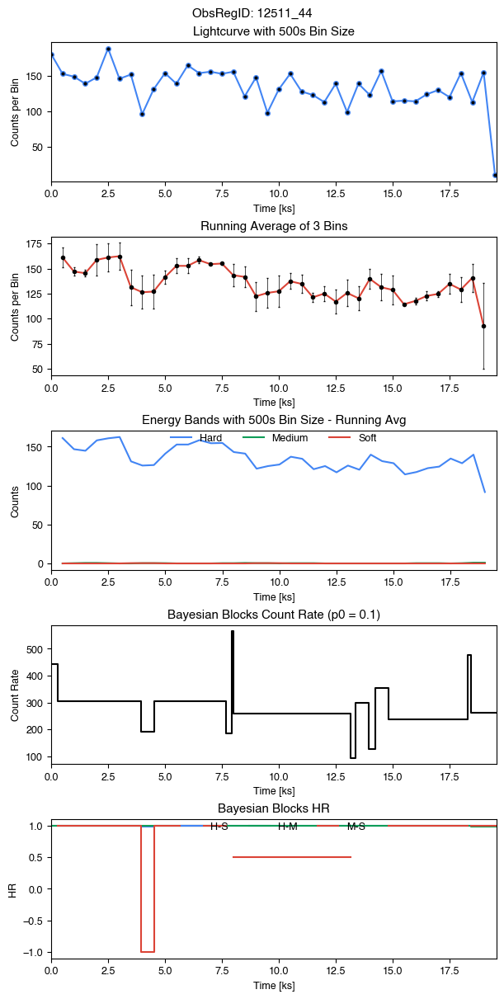

Name: 2CXO J163905.4-464212, ID: 12512-42, Date: 2011-06-27T05:12:44, Counts: 3210
RA  249.77278767919395 DEC  -46.70356333827938
varB  1.0 varH  1.0 varM  0.63 varS  nan varINDEX  9.0


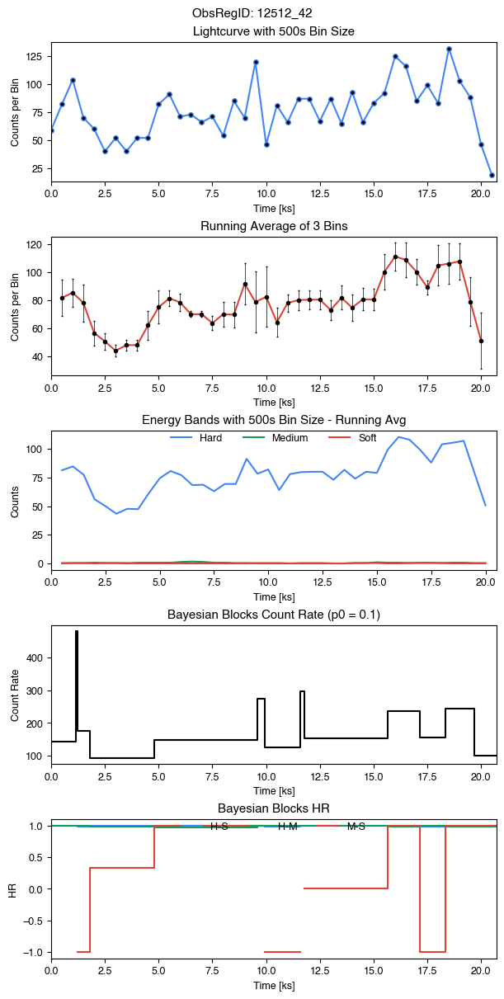

Name: 2CXO J163905.4-464212, ID: 12514-15, Date: 2011-06-10T16:28:13, Counts: 3379
RA  249.77278767919395 DEC  -46.70356333827938
varB  1.0 varH  1.0 varM  0.4 varS  0.53 varINDEX  10.0


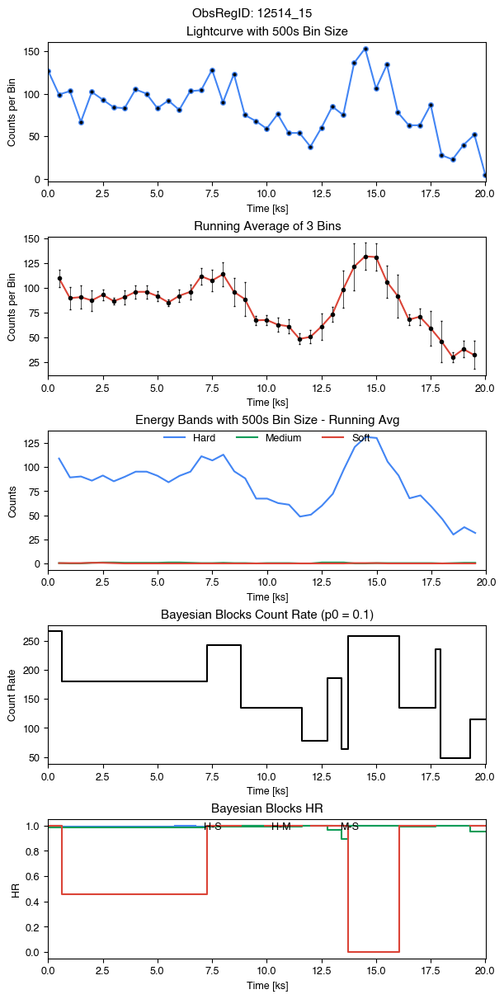

Name: 2CXO J191043.6+091629, ID: 13440-371, Date: 2011-08-18T07:58:55, Counts: 1721
RA  287.68194351388934 DEC  9.274871039140669
varB  1.0 varH  1.0 varM  0.42 varS  nan varINDEX  10.0


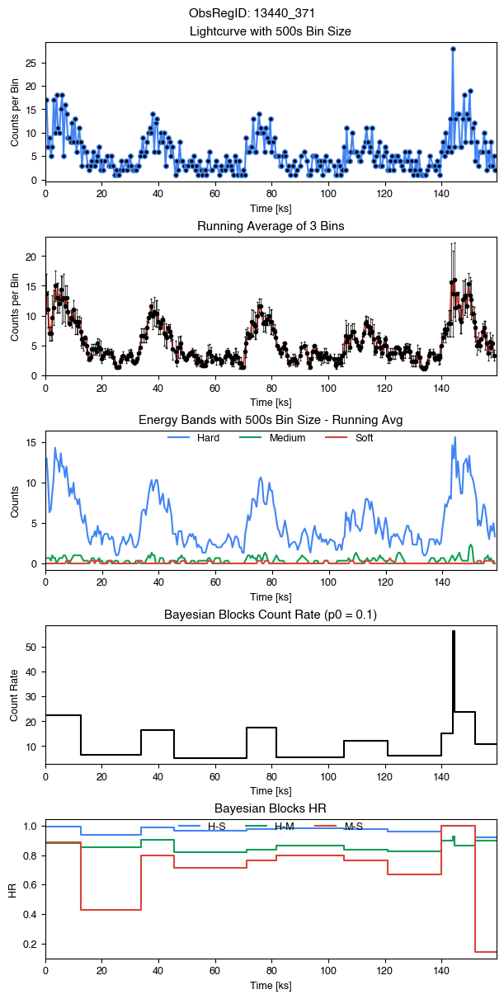

Name: 2CXO J172323.1-283757, ID: 13713-3, Date: 2012-07-11T05:36:29, Counts: 3933
RA  260.84658121118946 DEC  -28.63266533567224
varB  1.0 varH  1.0 varM  0.87 varS  0.92 varINDEX  9.0


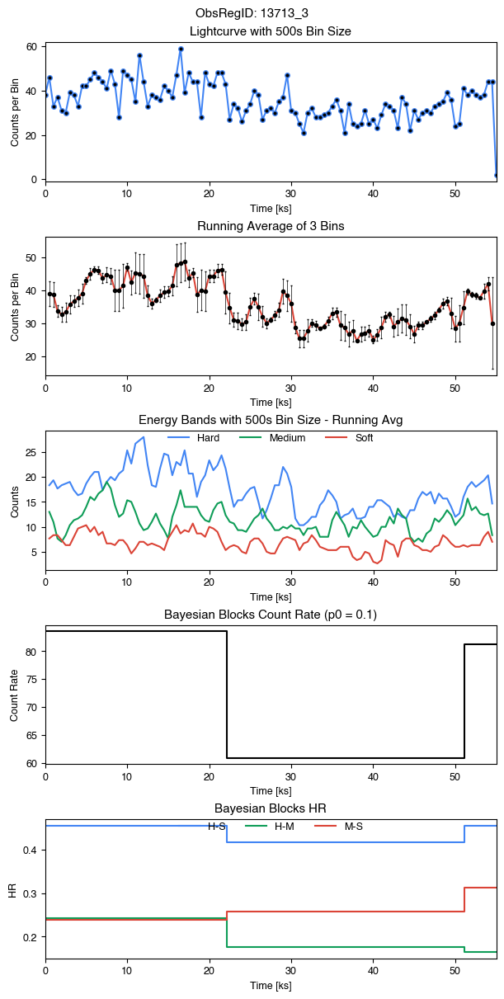

Name: 2CXO J132950.6+471155, ID: 13813-982, Date: 2012-09-09T18:18:20, Counts: 1594
RA  202.4611763183265 DEC  47.19867307640154
varB  1.0 varH  1.0 varM  0.3 varS  0.96 varINDEX  9.0


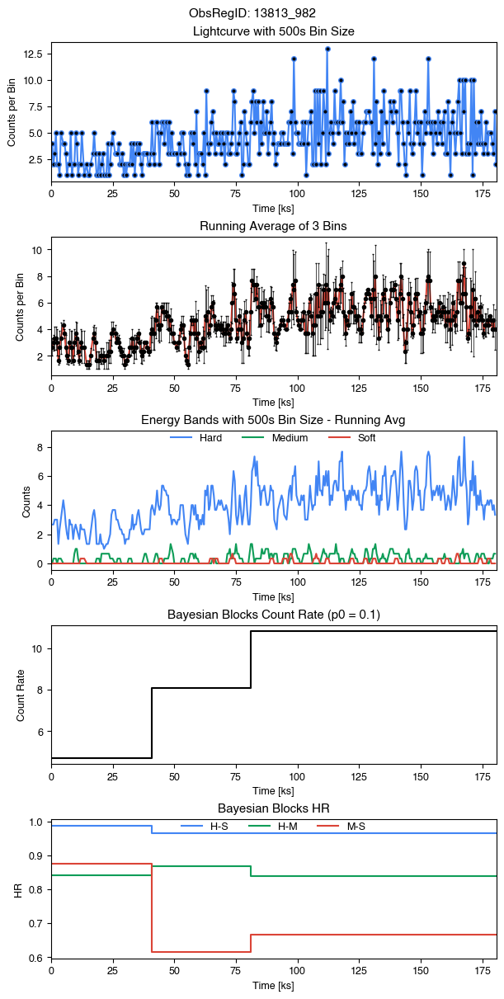

Name: 2CXO J064109.5+092925, ID: 14369-34, Date: 2011-12-08T05:12:23, Counts: 4071
RA  100.28976599620614 DEC  9.490363200939502
varB  1.0 varH  1.0 varM  0.22 varS  0.41 varINDEX  9.0


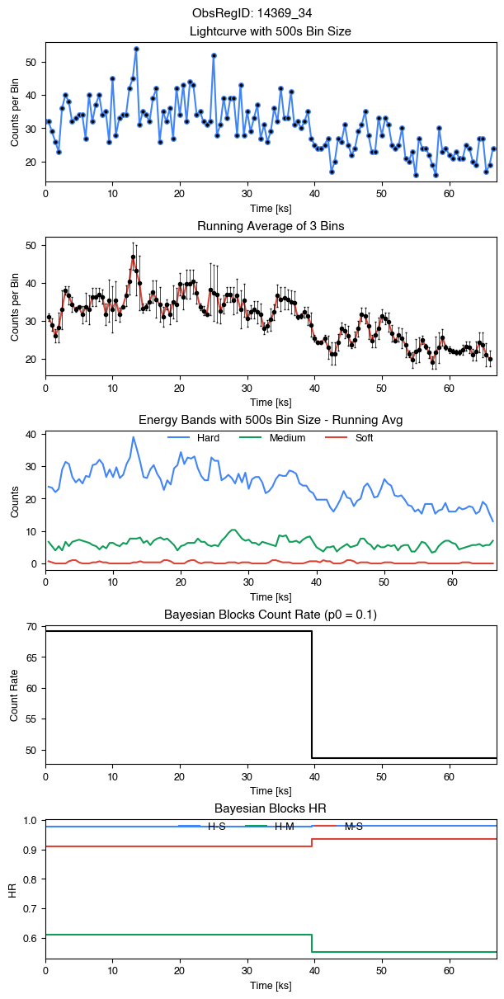

Name: 2CXO J053504.7-051742, ID: 1522-991, Date: 2000-04-01T17:48:45, Counts: 2392
RA  83.76981923550761 DEC  -5.29503731103261
varB  1.0 varH  1.0 varM  0.55 varS  0.99 varINDEX  8.0


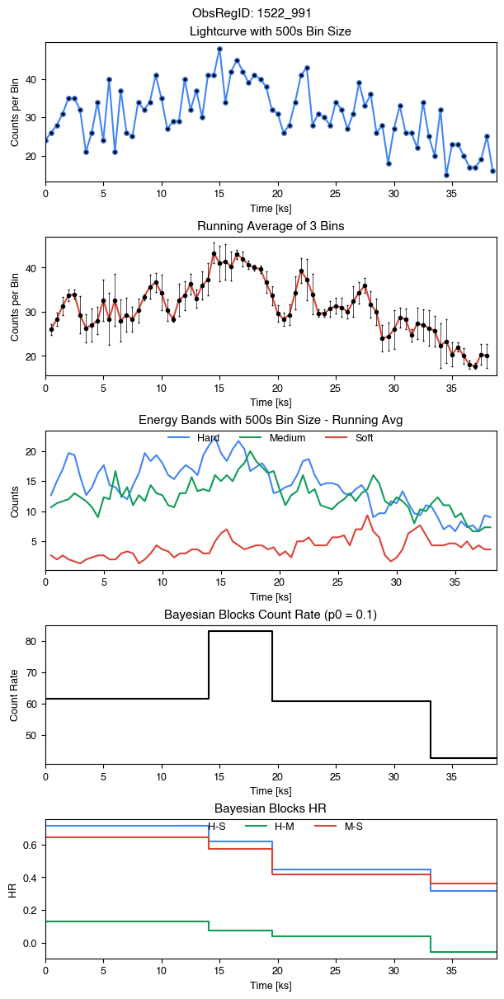

Name: 2CXO J012745.9-733256, ID: 15787-9, Date: 2014-07-18T22:12:03, Counts: 2569
RA  21.94142935655225 DEC  -73.54899359096329
varB  0.99 varH  0.95 varM  0.41 varS  0.27 varINDEX  7.0


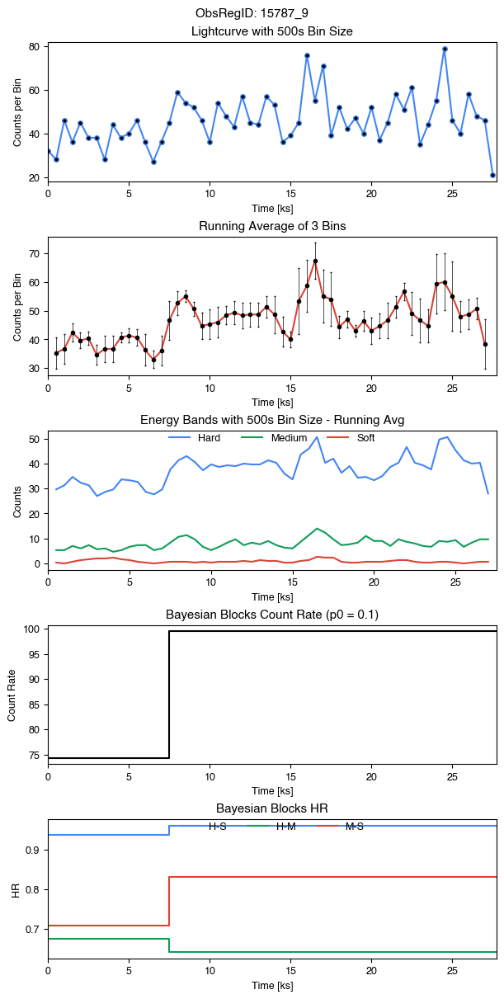

Name: 2CXO J202403.8+335201, ID: 16705-3, Date: 2015-07-28T09:45:42, Counts: 2934
RA  306.01589755653026 DEC  33.8671794069135
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


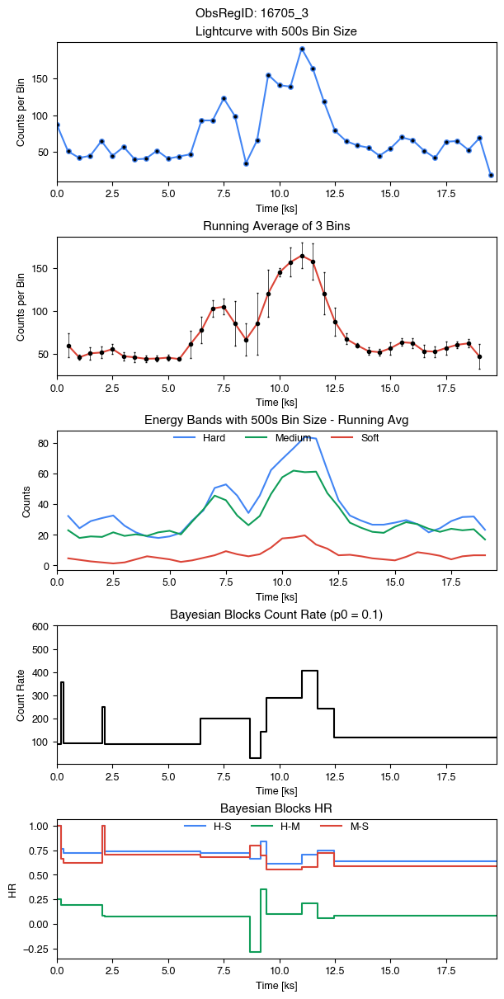

Name: 2CXO J202403.8+335201, ID: 16706-3, Date: 2015-08-01T12:28:56, Counts: 3362
RA  306.01589755653026 DEC  33.8671794069135
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


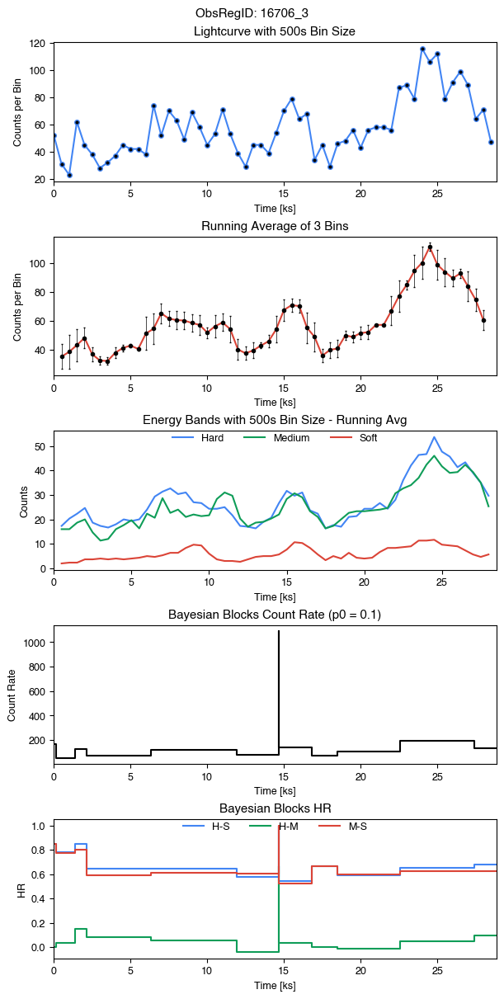

Name: 2CXO J004627.0+420152, ID: 17013-25, Date: 2015-10-17T19:59:43, Counts: 4094
RA  11.612616165184136 DEC  42.031228736623646
varB  0.91 varH  1.0 varM  0.04 varS  0.05 varINDEX  6.0


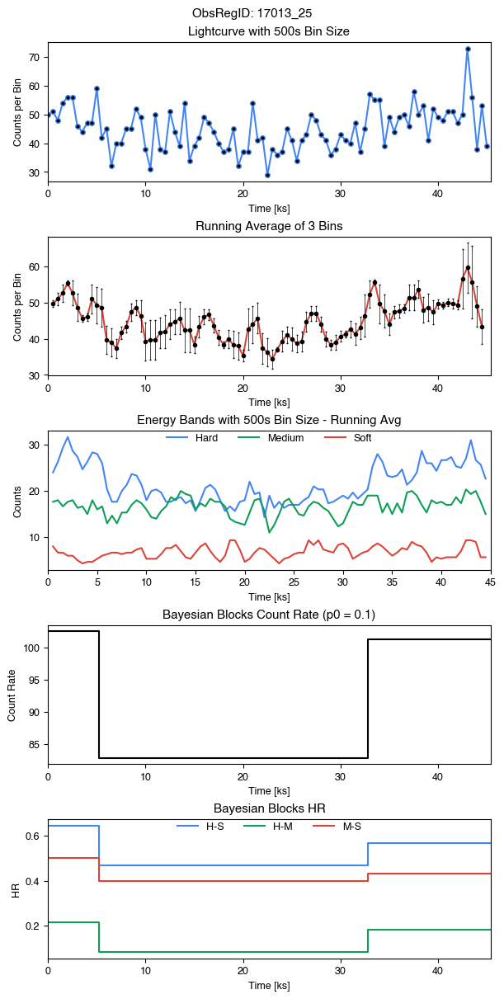

Name: 2CXO J120929.8+434106, ID: 17118-15, Date: 2016-04-04T18:02:57, Counts: 1444
RA  182.37416983090736 DEC  43.68523918018443
varB  1.0 varH  1.0 varM  0.33 varS  nan varINDEX  9.0


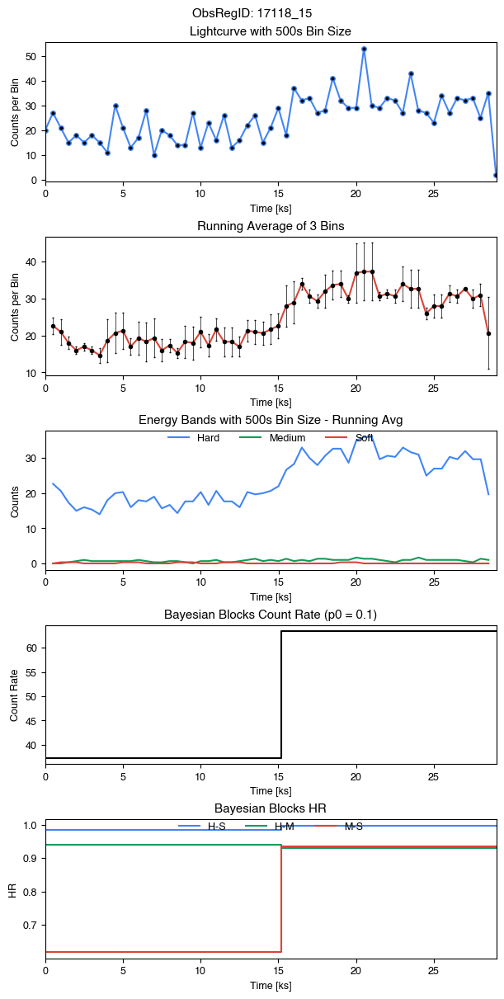

Name: 2CXO J162622.3-242253, ID: 17249-27, Date: 2014-10-06T05:48:06, Counts: 2030
RA  246.59330229401792 DEC  -24.381530843078124
varB  1.0 varH  1.0 varM  1.0 varS  0.87 varINDEX  10.0


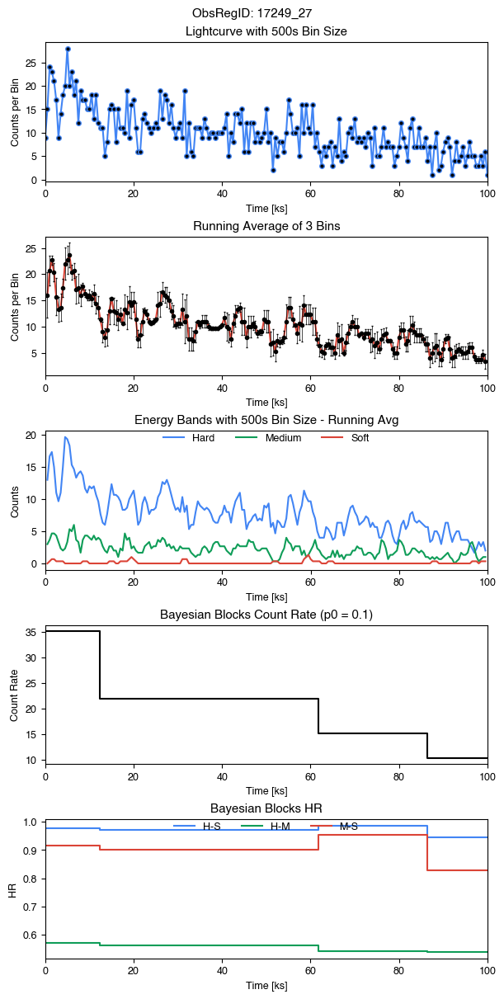

Name: 2CXO J162616.8-242223, ID: 17249-28, Date: 2014-10-06T05:48:06, Counts: 4407
RA  246.57020301134207 DEC  -24.373239494538264
varB  1.0 varH  1.0 varM  1.0 varS  0.36 varINDEX  10.0


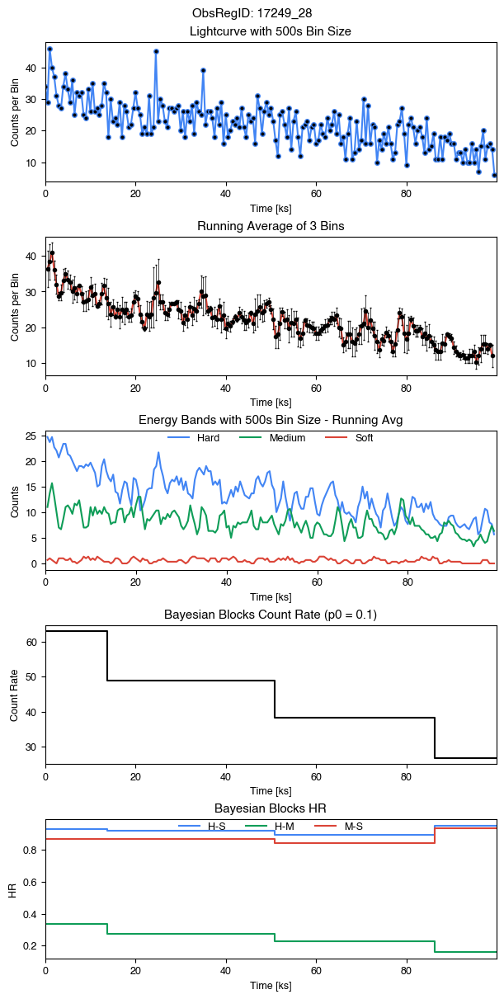

Name: 2CXO J130158.6-635808, ID: 18087-14, Date: 2016-05-03T10:48:15, Counts: 3810
RA  195.49433277138905 DEC  -63.96889657239079
varB  1.0 varH  1.0 varM  0.19 varS  0.41 varINDEX  9.0


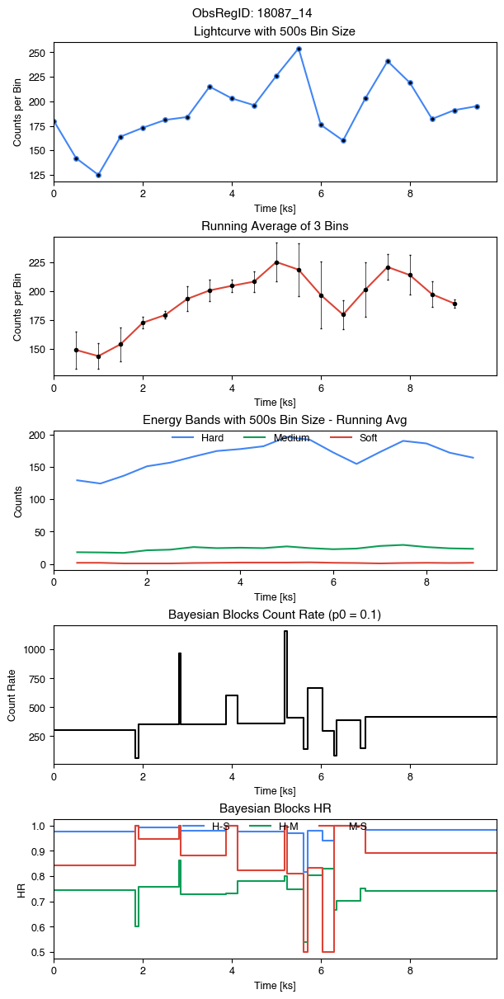

Name: 2CXO J172508.8-341112, ID: 18453-378, Date: 2016-07-05T20:27:41, Counts: 3500
RA  261.2869064510917 DEC  -34.18679756613263
varB  1.0 varH  0.41 varM  0.99 varS  0.07 varINDEX  7.0


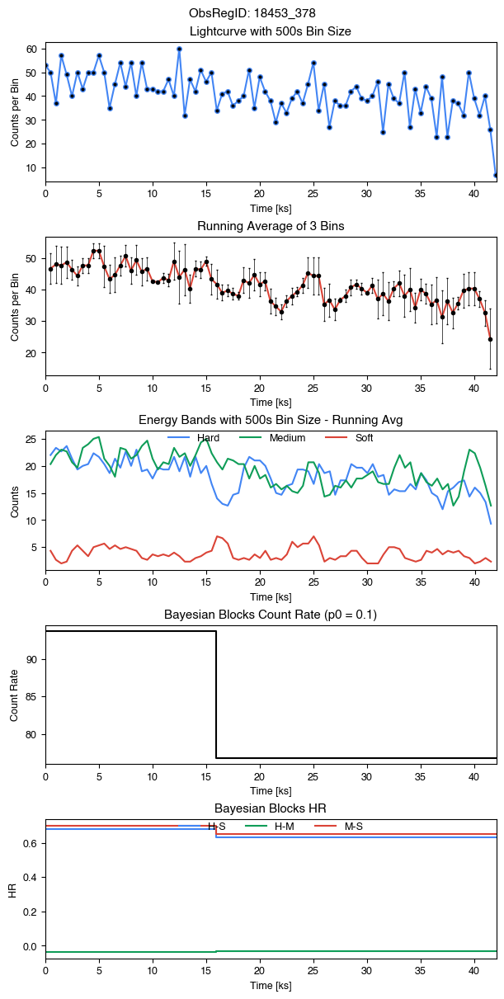

Name: 2CXO J043138.3+181357, ID: 1866-52, Date: 2001-07-23T05:30:36, Counts: 1884
RA  67.91006776024437 DEC  18.23257634344601
varB  1.0 varH  1.0 varM  0.62 varS  0.54 varINDEX  10.0


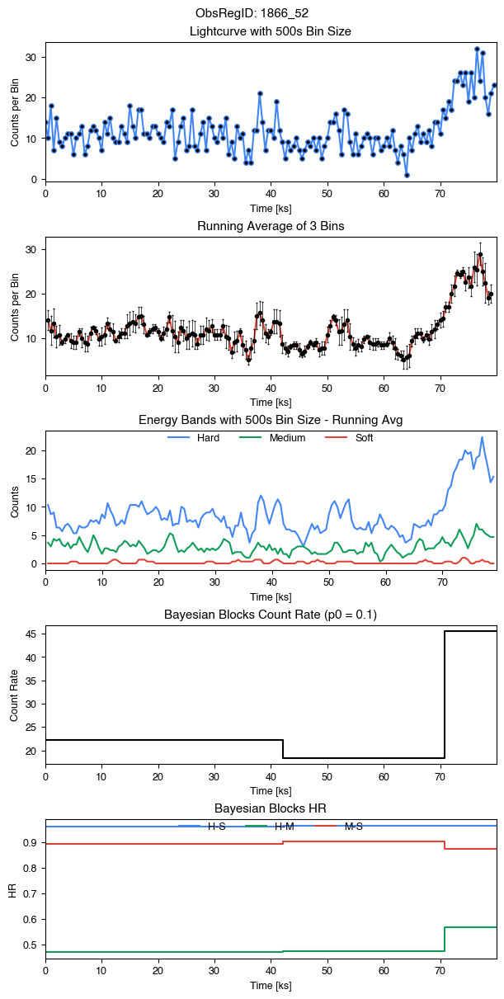

Name: 2CXO J053833.4-691158, ID: 18750-838, Date: 2016-01-20T01:11:37, Counts: 2371
RA  84.6393859649196 DEC  -69.19974643264861
varB  1.0 varH  1.0 varM  0.99 varS  0.3 varINDEX  10.0


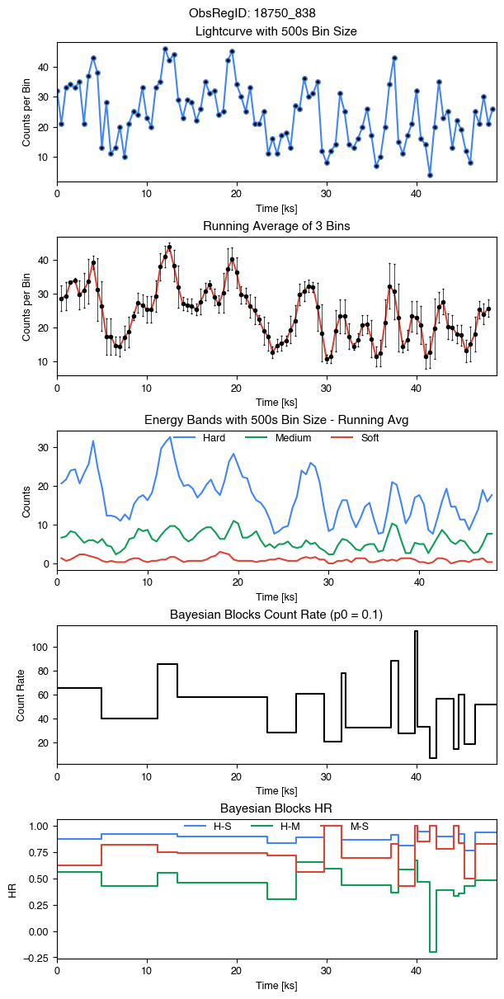

Name: 2CXO J054148.2-015602, ID: 1878-270, Date: 2001-08-08T07:02:51, Counts: 1417
RA  85.45093840641954 DEC  -1.9338912766841203
varB  1.0 varH  1.0 varM  1.0 varS  0.55 varINDEX  10.0


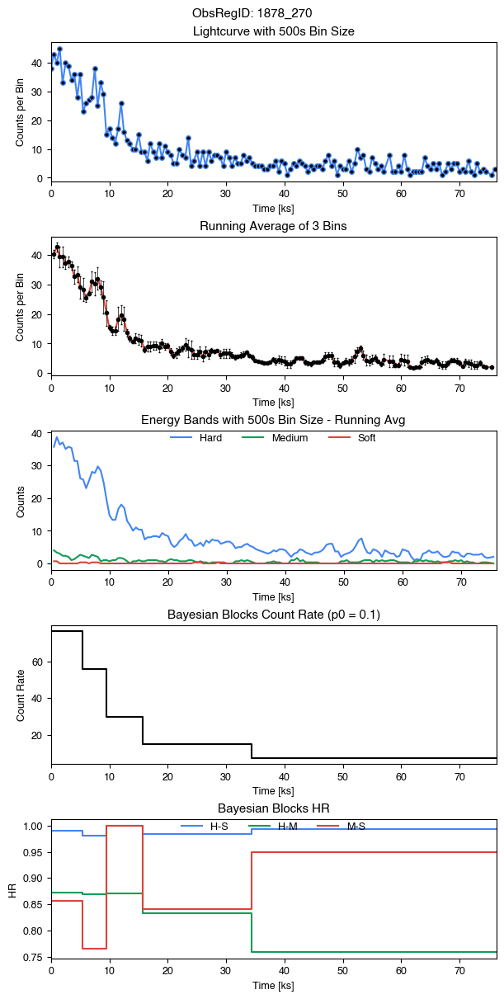

Name: 2CXO J224937.1-191626, ID: 19476-5, Date: 2016-09-20T09:45:35, Counts: 1656
RA  342.4047774915871 DEC  -19.273991926623285
varB  1.0 varH  1.0 varM  0.16 varS  0.17 varINDEX  8.0


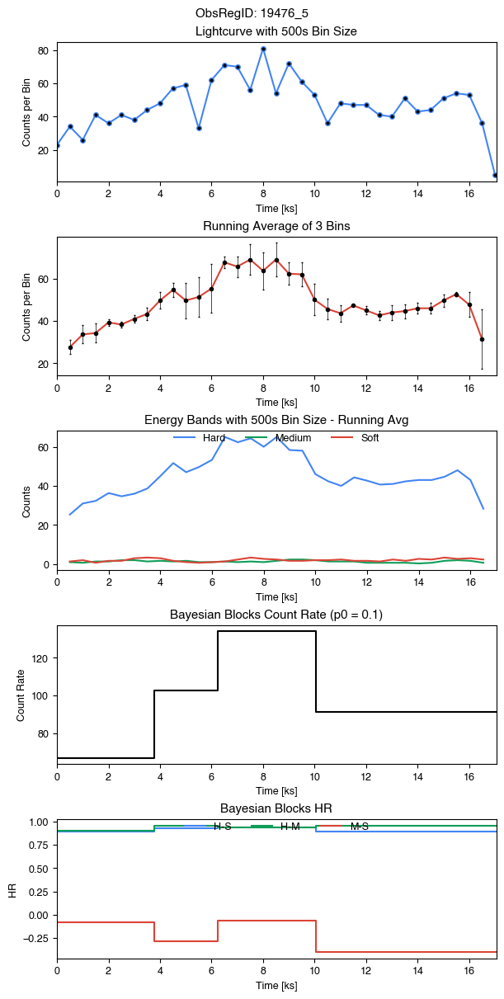

Name: 2CXO J224937.1-191626, ID: 19884-5, Date: 2016-09-25T05:32:10, Counts: 3612
RA  342.4047774915871 DEC  -19.273991926623285
varB  1.0 varH  1.0 varM  0.86 varS  0.11 varINDEX  8.0


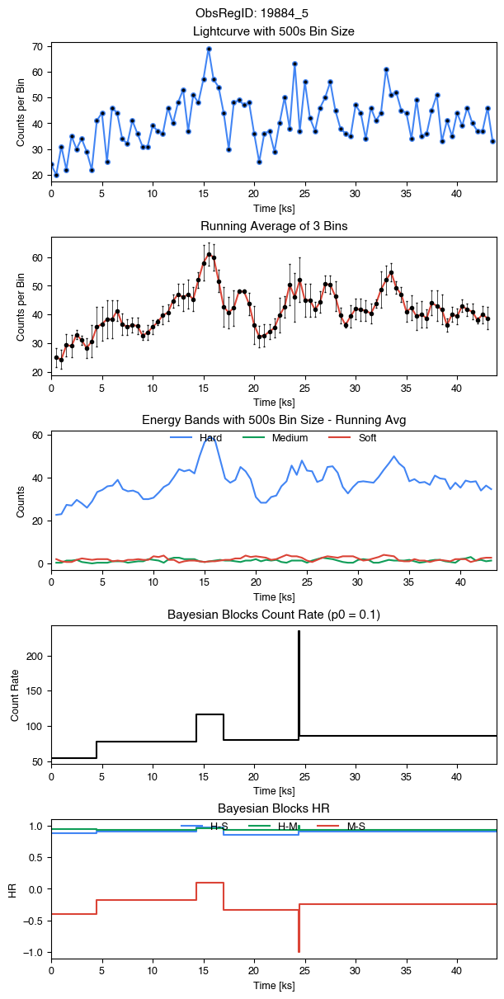

Name: 2CXO J200911.2+323353, ID: 21248-3, Date: 2019-01-09T19:54:41, Counts: 3099
RA  302.29695054602803 DEC  32.56477279548196
varB  1.0 varH  1.0 varM  1.0 varS  0.53 varINDEX  9.0


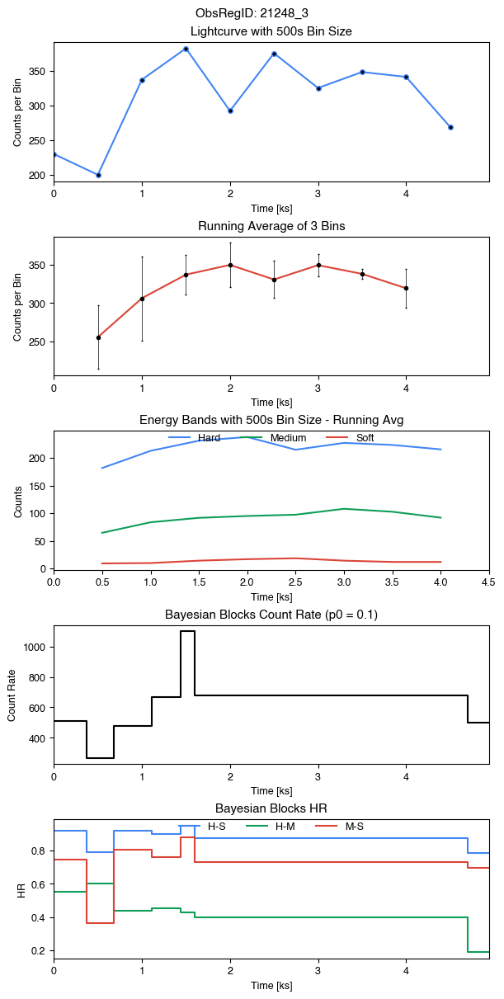

Name: 2CXO J172021.7-355248, ID: 2574-378, Date: 2002-08-31T13:10:45, Counts: 1317
RA  260.09082516782144 DEC  -35.88003122735938
varB  0.97 varH  0.96 varM  nan varS  nan varINDEX  6.0


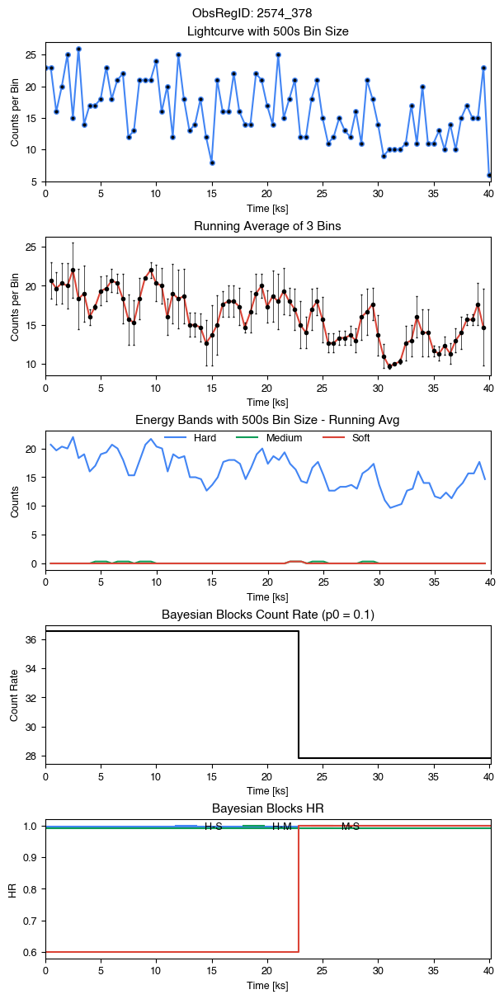

Name: 2CXO J053517.8-051835, ID: 3498-946, Date: 2003-01-21T06:26:35, Counts: 3884
RA  83.82454277924438 DEC  -5.3097755528494766
varB  1.0 varH  1.0 varM  0.41 varS  0.36 varINDEX  9.0


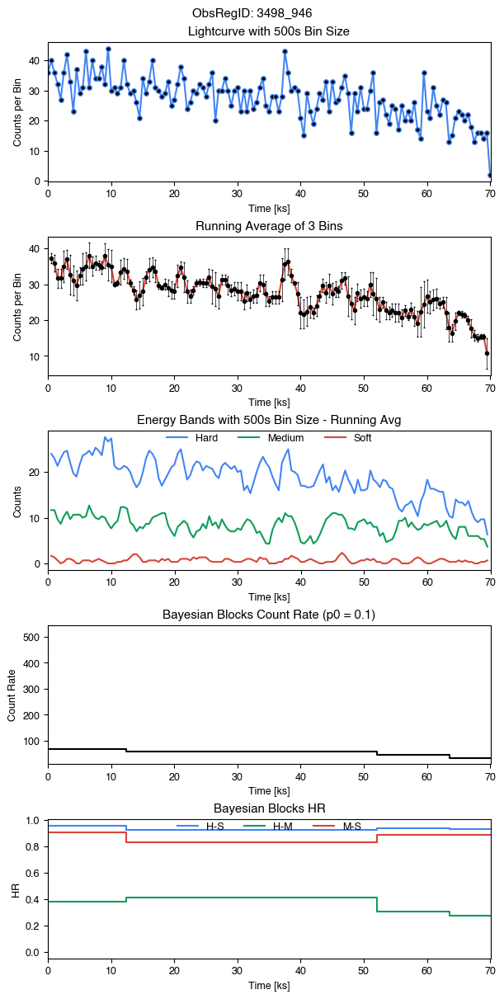

Name: 2CXO J053517.5-051739, ID: 3498-992, Date: 2003-01-21T06:26:35, Counts: 2678
RA  83.82299872943315 DEC  -5.2944278137694205
varB  1.0 varH  1.0 varM  0.34 varS  0.12 varINDEX  7.0


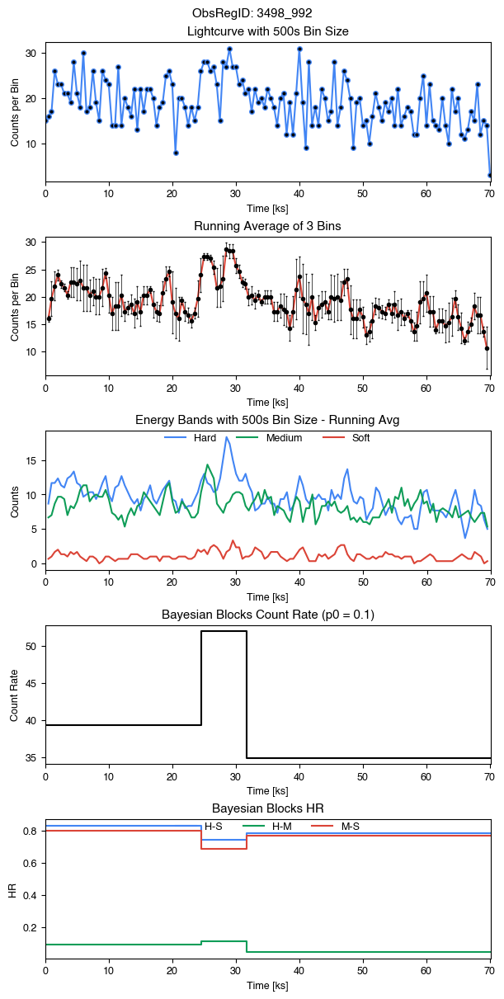

Name: 2CXO J053520.0-052105, ID: 3744-1434, Date: 2003-01-10T16:33:58, Counts: 3734
RA  83.83355191250985 DEC  -5.351635153935152
varB  1.0 varH  1.0 varM  1.0 varS  0.47 varINDEX  10.0


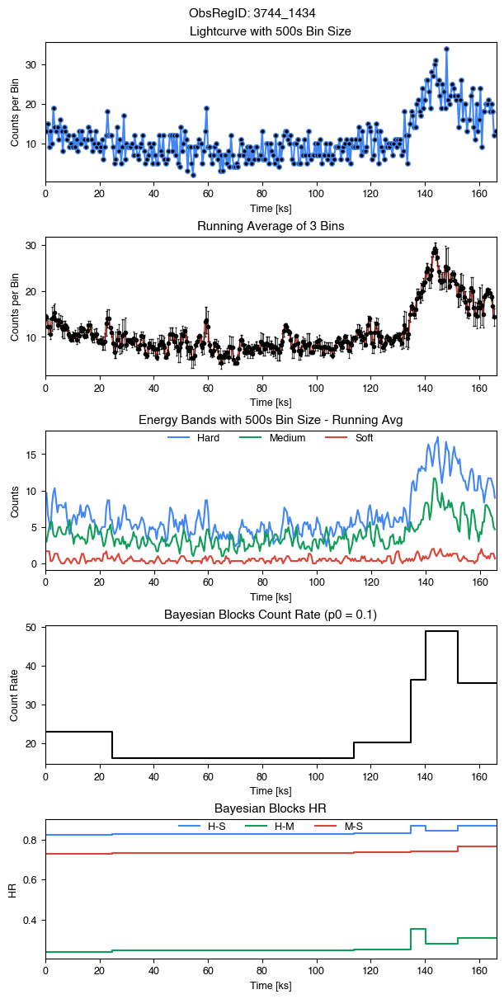

Name: 2CXO J053513.7-052135, ID: 3744-2505, Date: 2003-01-10T16:33:58, Counts: 2465
RA  83.80717481940661 DEC  -5.359956729398702
varB  1.0 varH  1.0 varM  1.0 varS  0.67 varINDEX  10.0


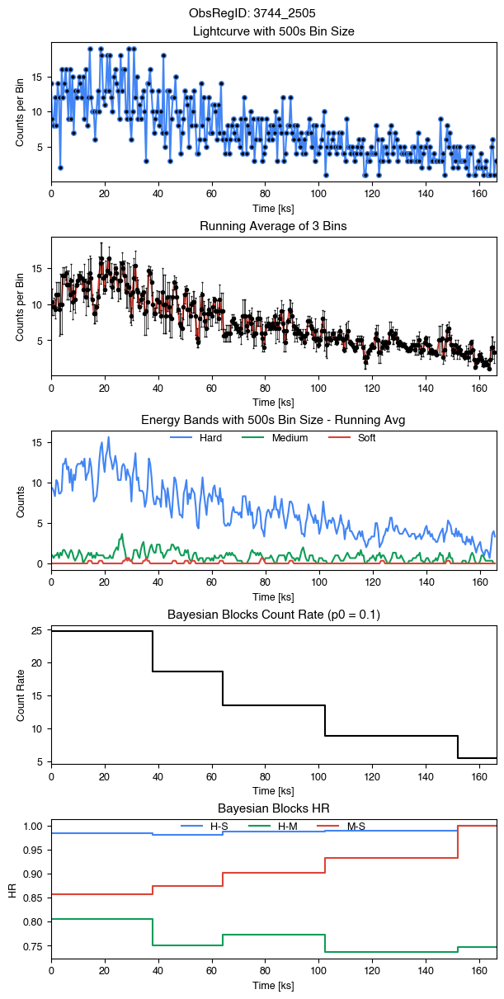

Name: 2CXO J053514.6-052301, ID: 3744-2586, Date: 2003-01-10T16:33:58, Counts: 3933
RA  83.81110232595438 DEC  -5.383846489805644
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


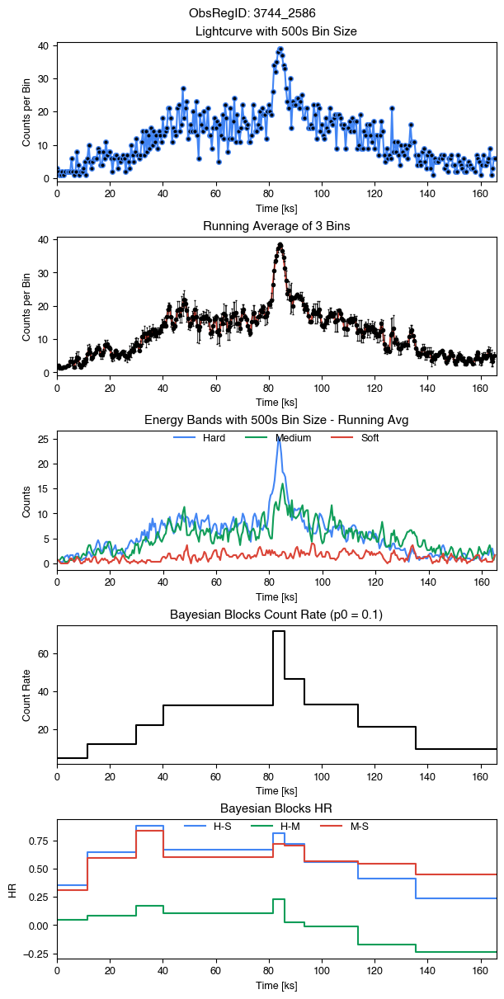

Name: 2CXO J053514.7-052229, ID: 3744-3297, Date: 2003-01-10T16:33:58, Counts: 1319
RA  83.81135879523731 DEC  -5.374931979983417
varB  1.0 varH  1.0 varM  0.5 varS  nan varINDEX  8.0


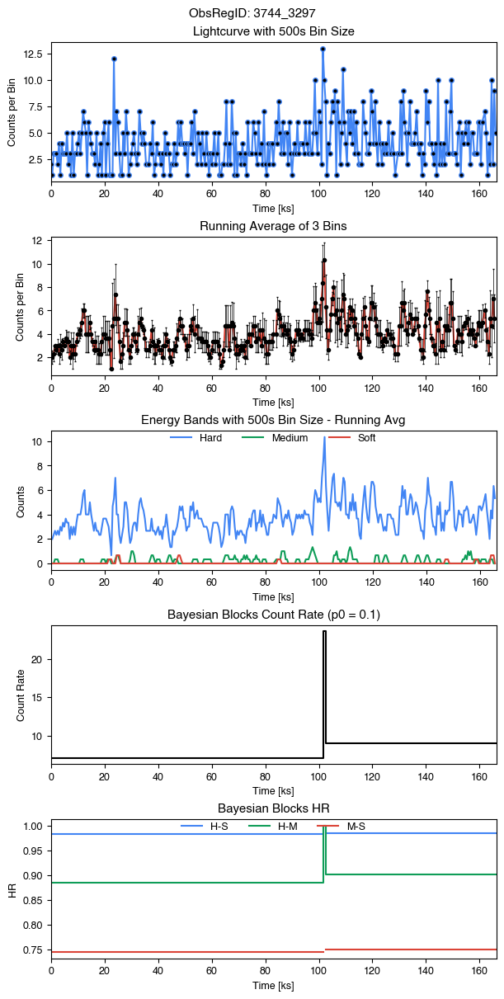

Name: 2CXO J053518.0-052205, ID: 3744-642, Date: 2003-01-10T16:33:58, Counts: 2460
RA  83.82511589877589 DEC  -5.368151681449908
varB  1.0 varH  1.0 varM  1.0 varS  0.67 varINDEX  10.0


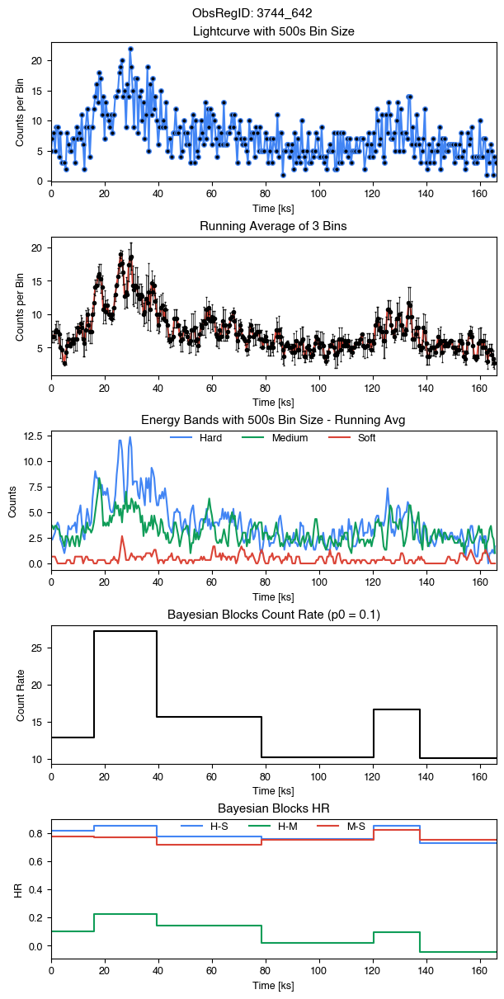

Name: 2CXO J053526.0-052120, ID: 3744-726, Date: 2003-01-10T16:33:58, Counts: 3267
RA  83.85859850994751 DEC  -5.35581131251741
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


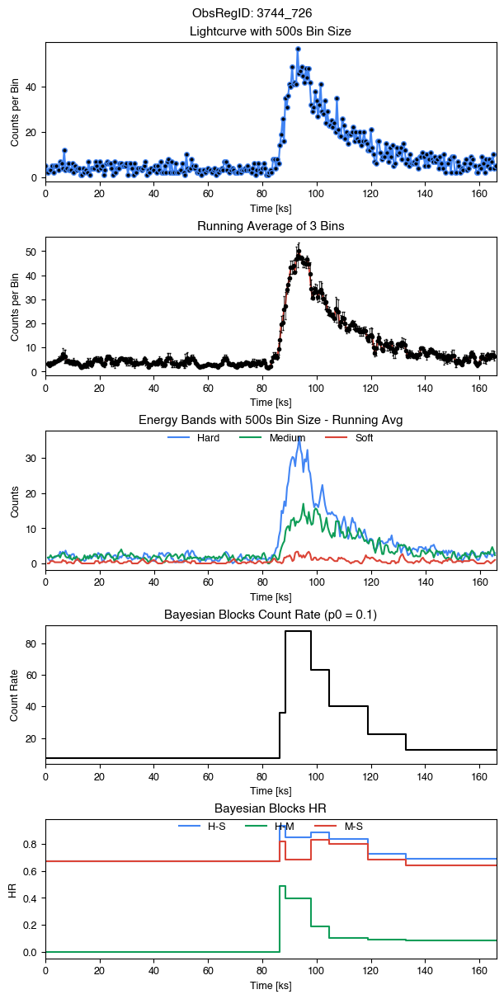

Name: 2CXO J053511.9-052032, ID: 3744-807, Date: 2003-01-10T16:33:58, Counts: 3360
RA  83.79986718829207 DEC  -5.3425087602906665
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


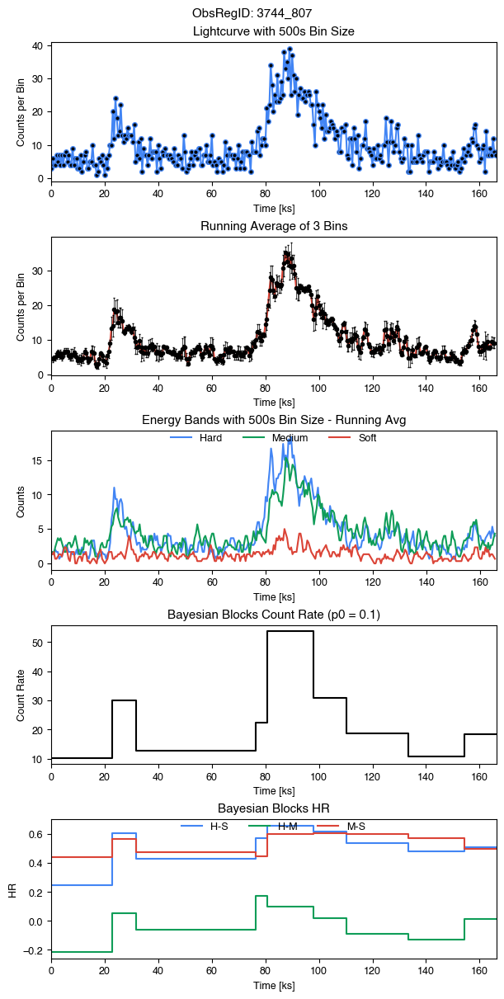

Name: 2CXO J053527.7-051804, ID: 3744-978, Date: 2003-01-10T16:33:58, Counts: 2368
RA  83.8656116812399 DEC  -5.301238643338194
varB  1.0 varH  0.67 varM  0.8 varS  0.09 varINDEX  7.0


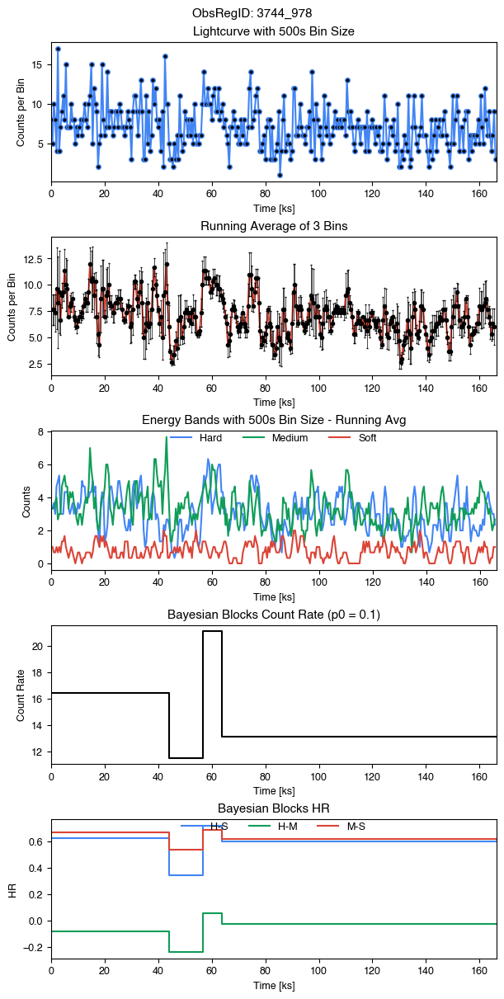

Name: 2CXO J053504.7-051742, ID: 3744-991, Date: 2003-01-10T16:33:58, Counts: 3985
RA  83.76981923550761 DEC  -5.29503731103261
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


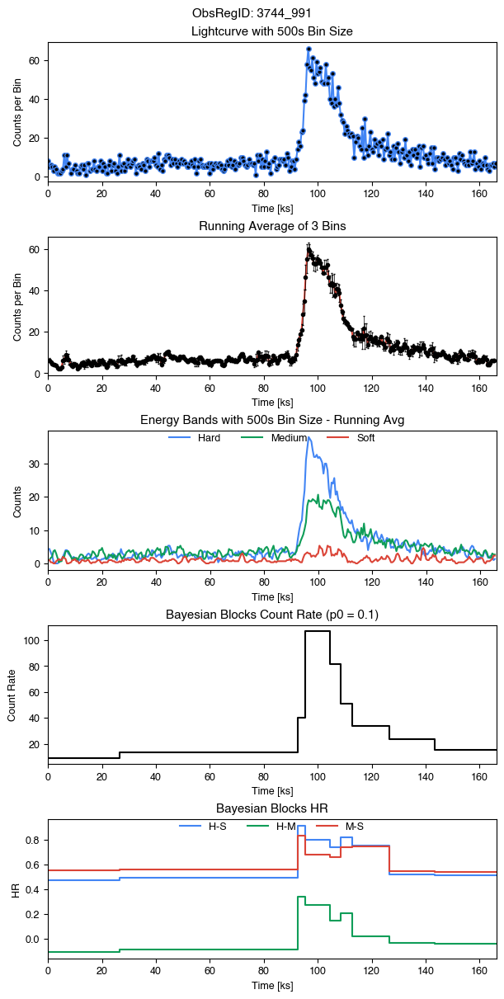

Name: 2CXO J163553.8-472540, ID: 3877-49, Date: 2003-03-24T04:20:42, Counts: 7324
RA  248.974214433111 DEC  -47.42785707211955
varB  1.0 varH  1.0 varM  0.35 varS  nan varINDEX  10.0


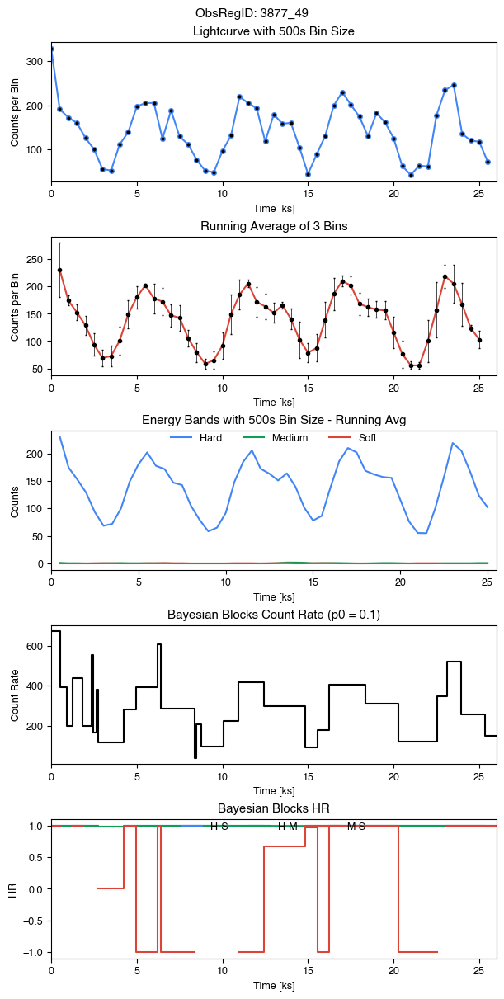

Name: 2CXO J193840.1+303028, ID: 4359-7, Date: 2002-08-30T09:02:10, Counts: 5057
RA  294.66711223753373 DEC  30.507877115495216
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


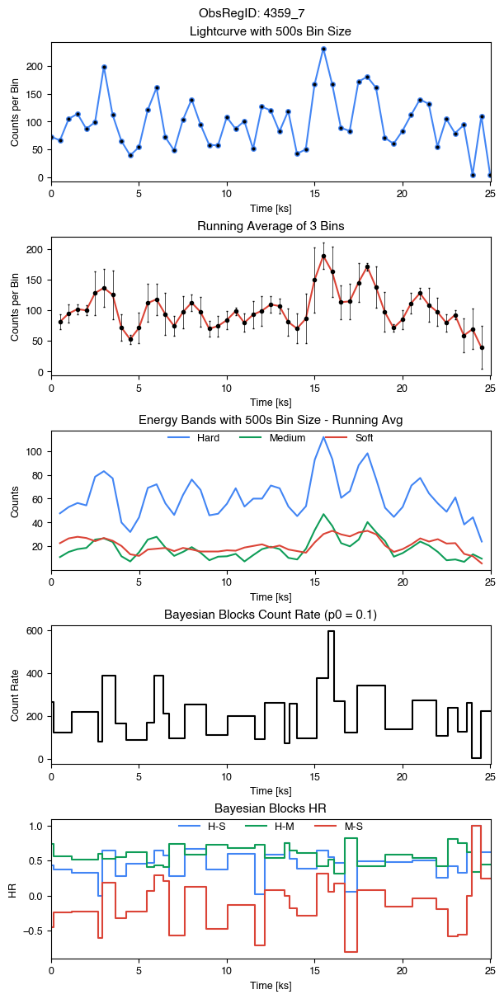

Name: 2CXO J053520.0-052105, ID: 4373-1434, Date: 2003-01-13T07:51:03, Counts: 3789
RA  83.83355191250985 DEC  -5.351635153935152
varB  1.0 varH  1.0 varM  0.91 varS  0.94 varINDEX  7.0


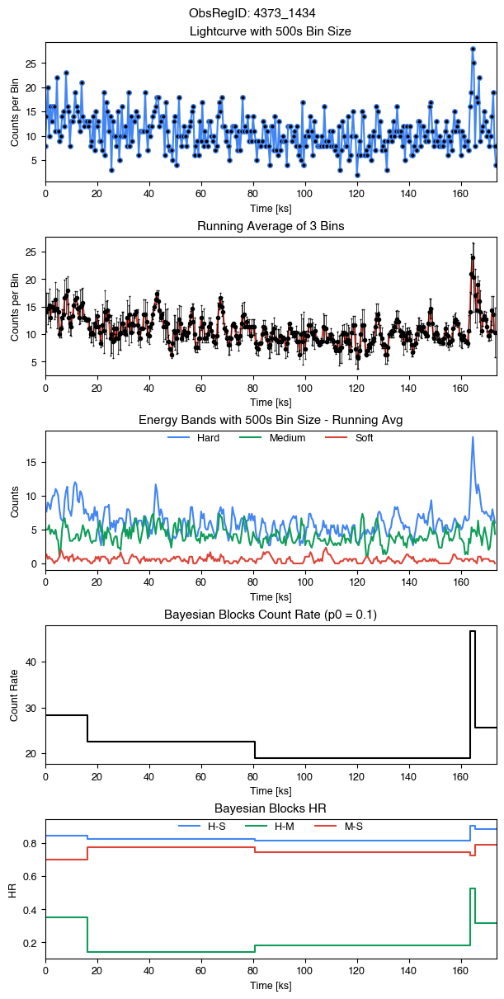

Name: 2CXO J053506.2-052202, ID: 4373-2516, Date: 2003-01-13T07:51:03, Counts: 2479
RA  83.77616596876652 DEC  -5.367441070367692
varB  1.0 varH  1.0 varM  0.99 varS  0.07 varINDEX  9.0


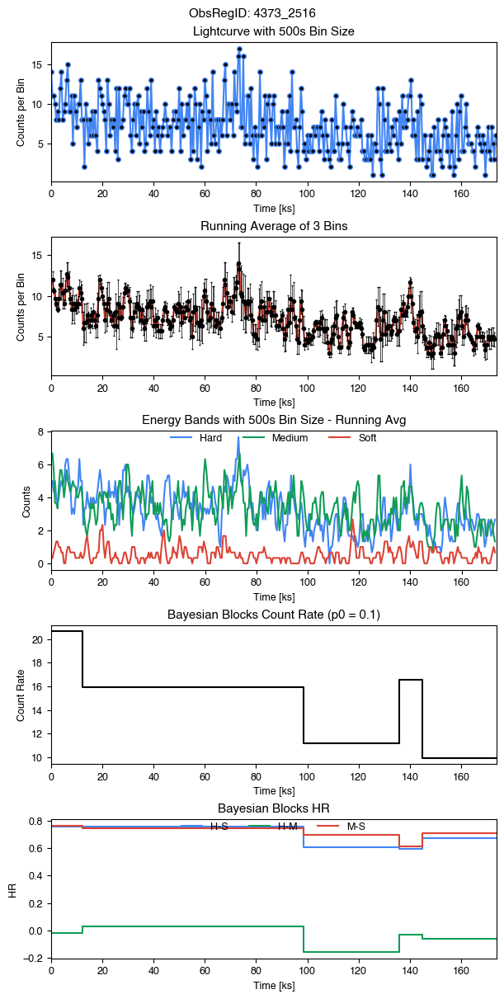

Name: 2CXO J053509.7-052128, ID: 4373-2620, Date: 2003-01-13T07:51:03, Counts: 2672
RA  83.79069585645362 DEC  -5.357863597589054
varB  1.0 varH  1.0 varM  1.0 varS  0.56 varINDEX  9.0


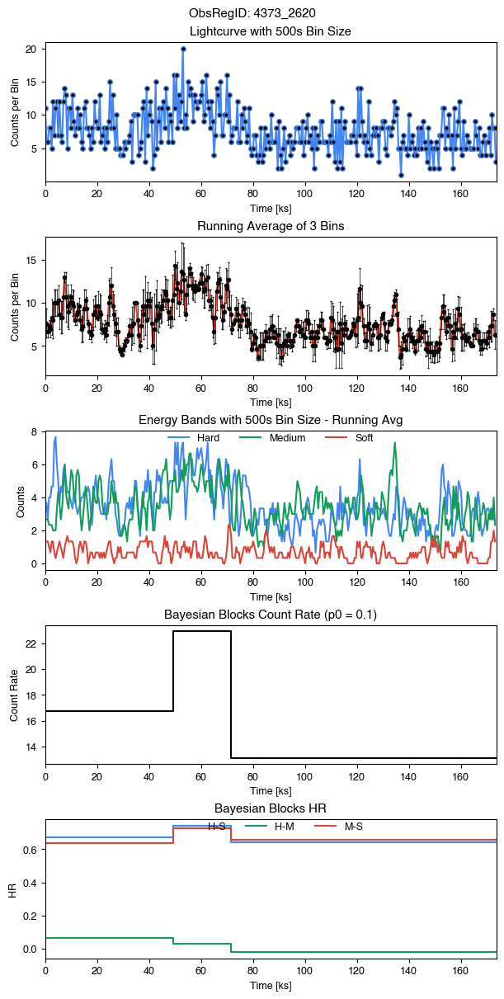

Name: 2CXO J053515.6-052338, ID: 4373-2662, Date: 2003-01-13T07:51:03, Counts: 2006
RA  83.8153272057985 DEC  -5.394193279095926
varB  1.0 varH  1.0 varM  1.0 varS  0.61 varINDEX  10.0


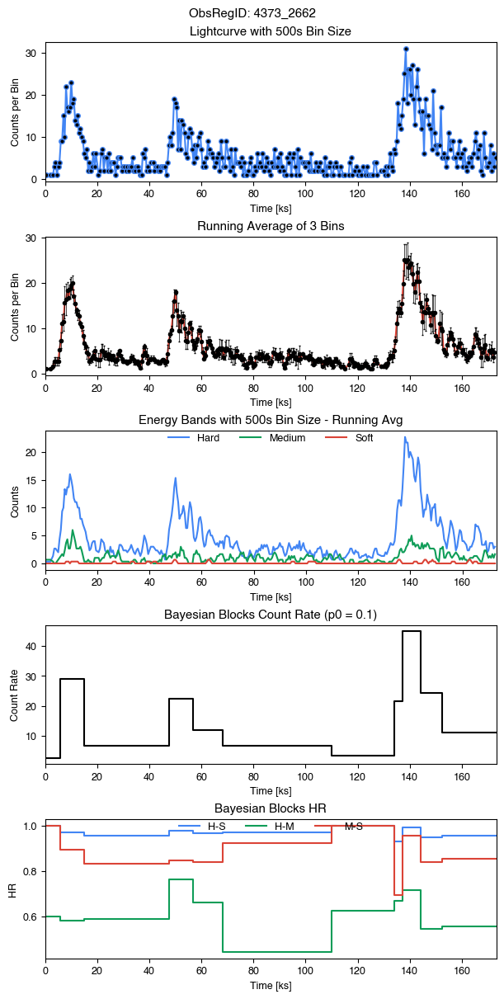

Name: 2CXO J053517.0-052333, ID: 4373-2667, Date: 2003-01-13T07:51:03, Counts: 4846
RA  83.82111719825627 DEC  -5.392786658202525
varB  1.0 varH  1.0 varM  1.0 varS  0.62 varINDEX  10.0


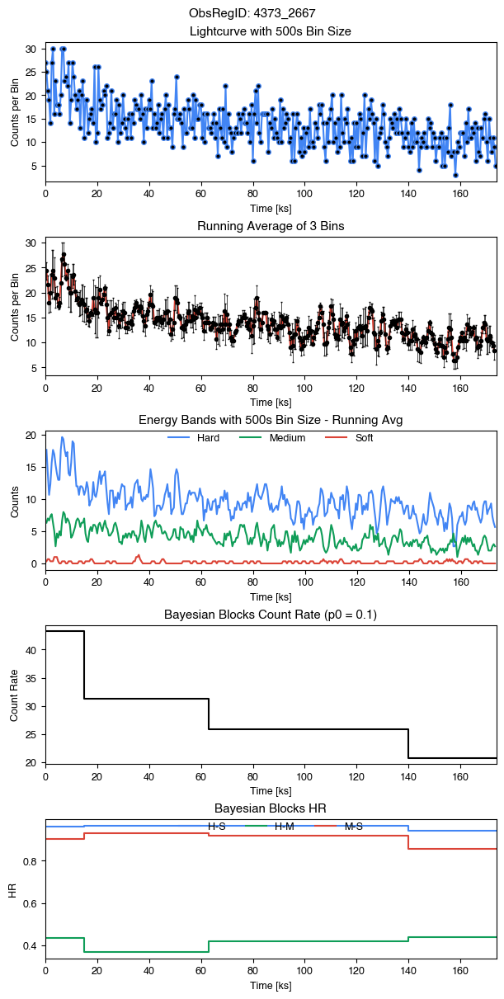

Name: 2CXO J053511.8-052149, ID: 4373-2675, Date: 2003-01-13T07:51:03, Counts: 5838
RA  83.79917980135292 DEC  -5.36369900095813
varB  1.0 varH  1.0 varM  0.02 varS  0.27 varINDEX  8.0


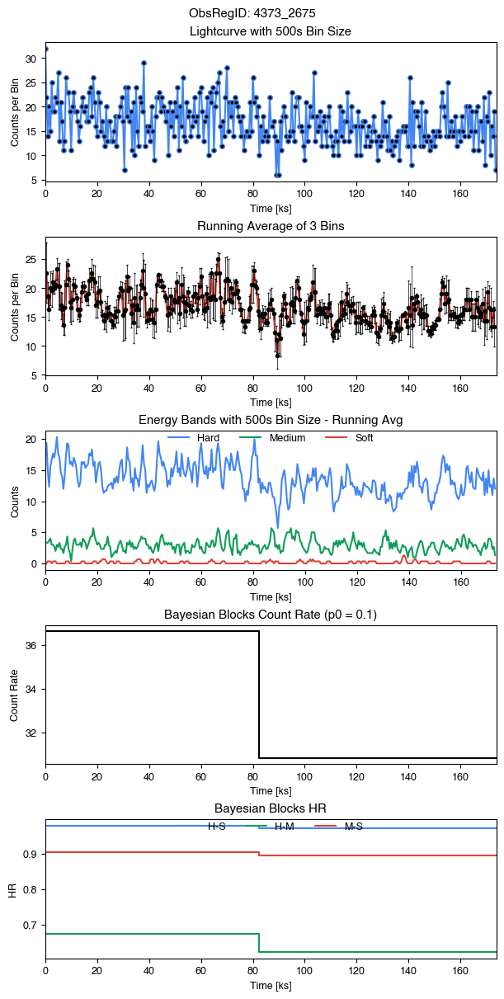

Name: 2CXO J053514.3-052232, ID: 4373-3135, Date: 2003-01-13T07:51:03, Counts: 1227
RA  83.80980427700138 DEC  -5.375754556764319
varB  1.0 varH  1.0 varM  0.57 varS  nan varINDEX  10.0


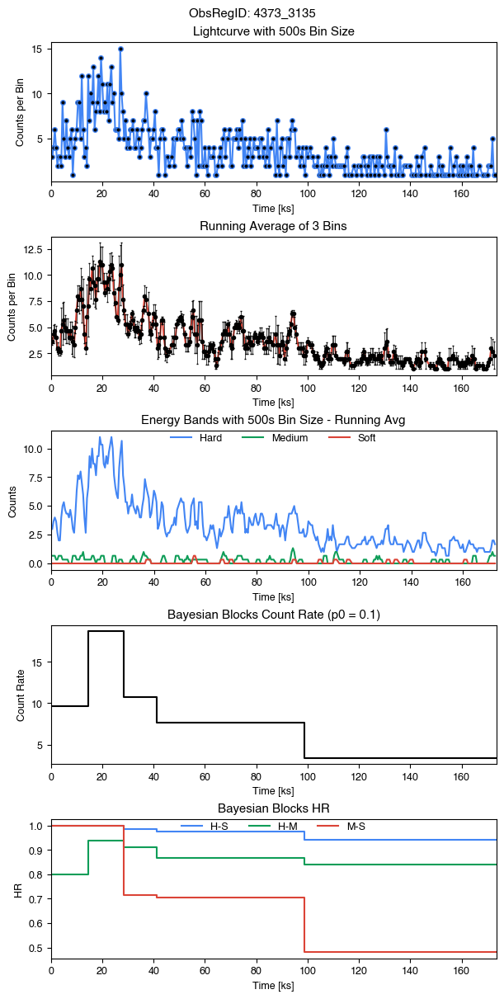

Name: 2CXO J053516.2-052210, ID: 4373-3289, Date: 2003-01-13T07:51:03, Counts: 2433
RA  83.81780932245636 DEC  -5.369575660001801
varB  1.0 varH  1.0 varM  1.0 varS  0.97 varINDEX  10.0


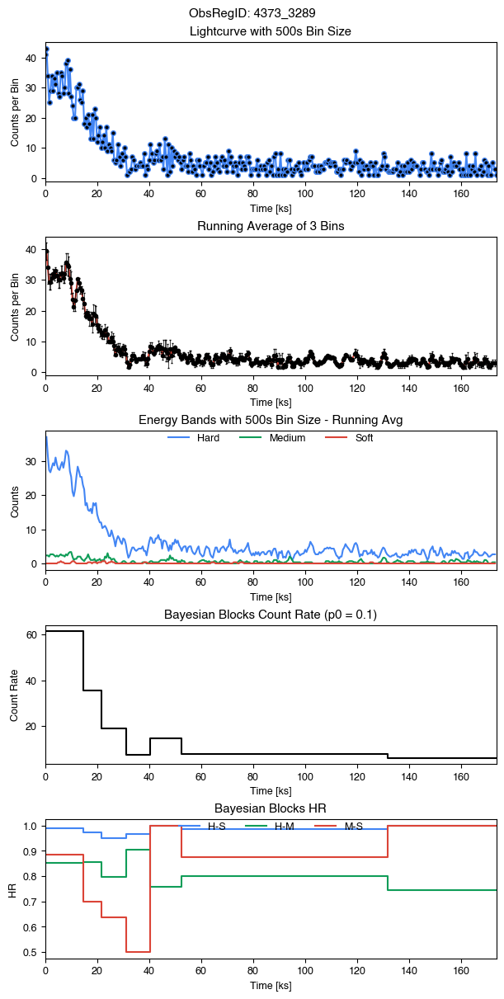

Name: 2CXO J053514.7-052229, ID: 4373-3297, Date: 2003-01-13T07:51:03, Counts: 1687
RA  83.81135879523731 DEC  -5.374931979983417
varB  1.0 varH  1.0 varM  0.34 varS  nan varINDEX  8.0


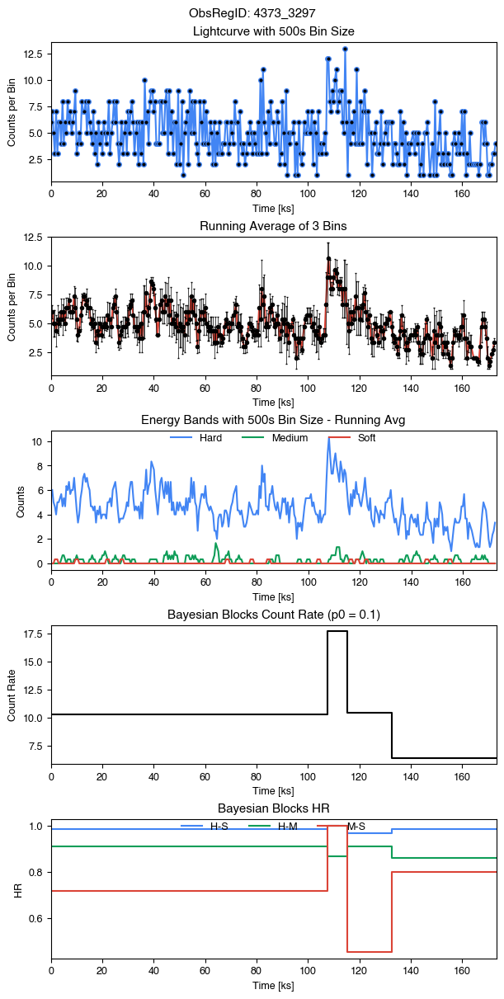

Name: 2CXO J053513.6-051954, ID: 4373-868, Date: 2003-01-13T07:51:03, Counts: 4404
RA  83.80675389866639 DEC  -5.33188393437455
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


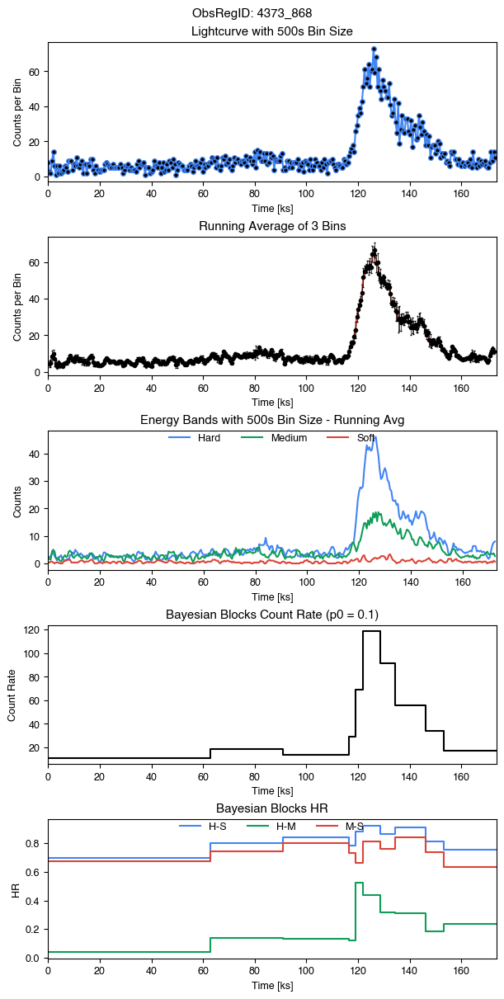

Name: 2CXO J053521.7-051946, ID: 4373-875, Date: 2003-01-13T07:51:03, Counts: 1757
RA  83.84059469875308 DEC  -5.329528228743617
varB  1.0 varH  1.0 varM  1.0 varS  0.46 varINDEX  10.0


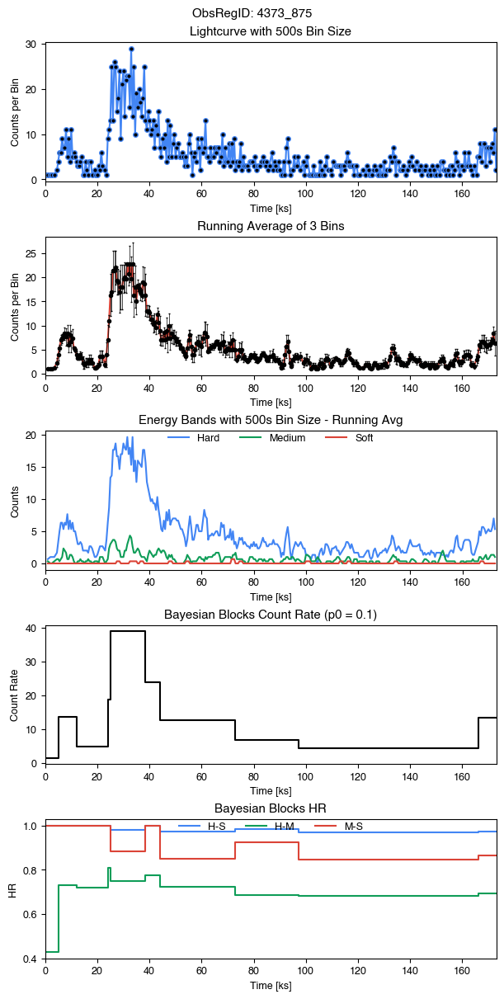

Name: 2CXO J053527.7-051804, ID: 4373-978, Date: 2003-01-13T07:51:03, Counts: 3497
RA  83.8656116812399 DEC  -5.301238643338194
varB  1.0 varH  0.13 varM  1.0 varS  0.18 varINDEX  7.0


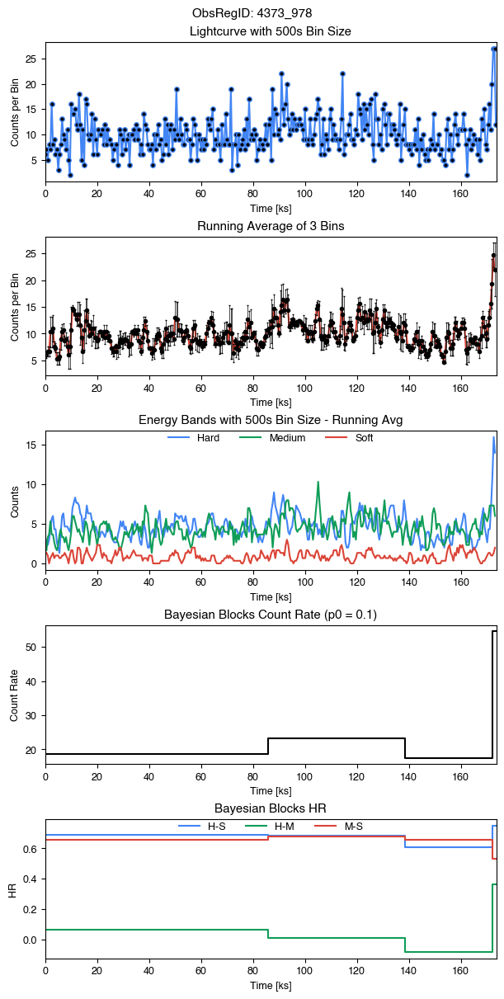

Name: 2CXO J053520.0-052105, ID: 4374-1434, Date: 2003-01-16T00:16:53, Counts: 3106
RA  83.83355191250985 DEC  -5.351635153935152
varB  1.0 varH  1.0 varM  0.99 varS  0.11 varINDEX  8.0


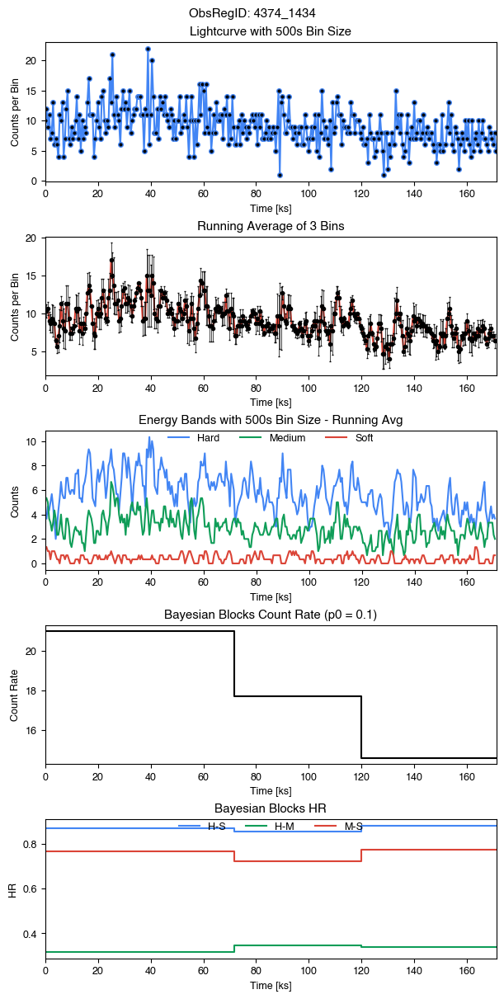

Name: 2CXO J053517.9-051613, ID: 4374-2208, Date: 2003-01-16T00:16:53, Counts: 2400
RA  83.8249471904196 DEC  -5.27038809718575
varB  1.0 varH  1.0 varM  1.0 varS  0.86 varINDEX  9.0


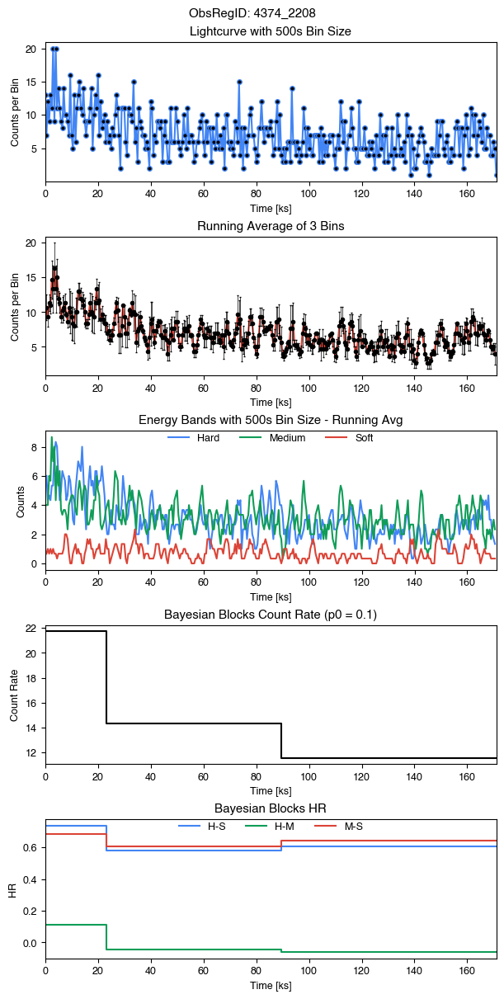

Name: 2CXO J053517.0-052333, ID: 4374-2667, Date: 2003-01-16T00:16:53, Counts: 2650
RA  83.82111719825627 DEC  -5.392786658202525
varB  1.0 varH  0.86 varM  0.03 varS  0.28 varINDEX  7.0


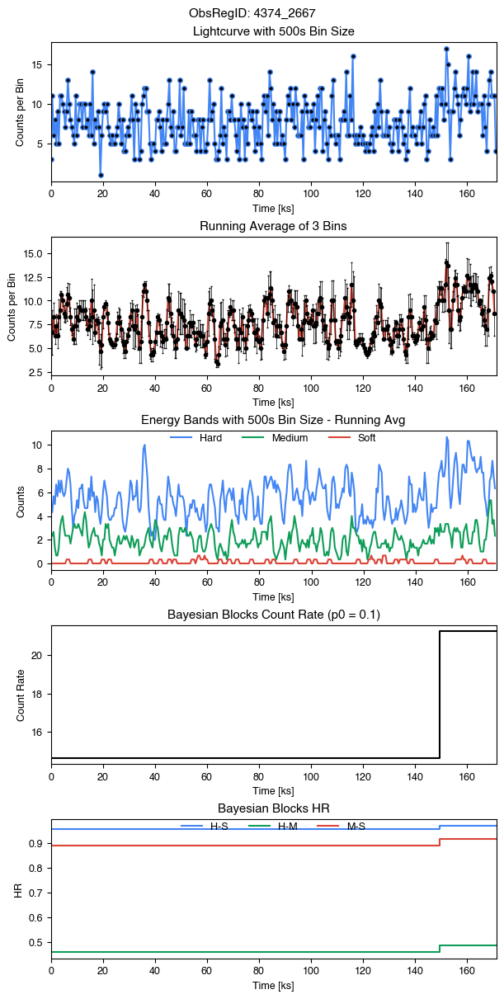

Name: 2CXO J053501.3-052811, ID: 4374-3060, Date: 2003-01-16T00:16:53, Counts: 4047
RA  83.75558259204666 DEC  -5.470028584044661
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


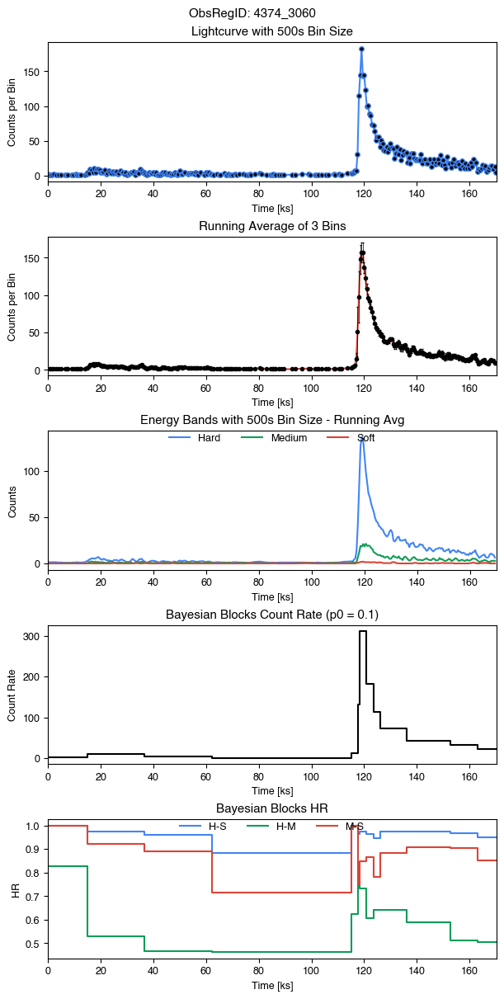

Name: 2CXO J053516.0-052322, ID: 4374-3155, Date: 2003-01-16T00:16:53, Counts: 1286
RA  83.81707048543024 DEC  -5.389736572965634
varB  1.0 varH  1.0 varM  0.15 varS  nan varINDEX  9.0


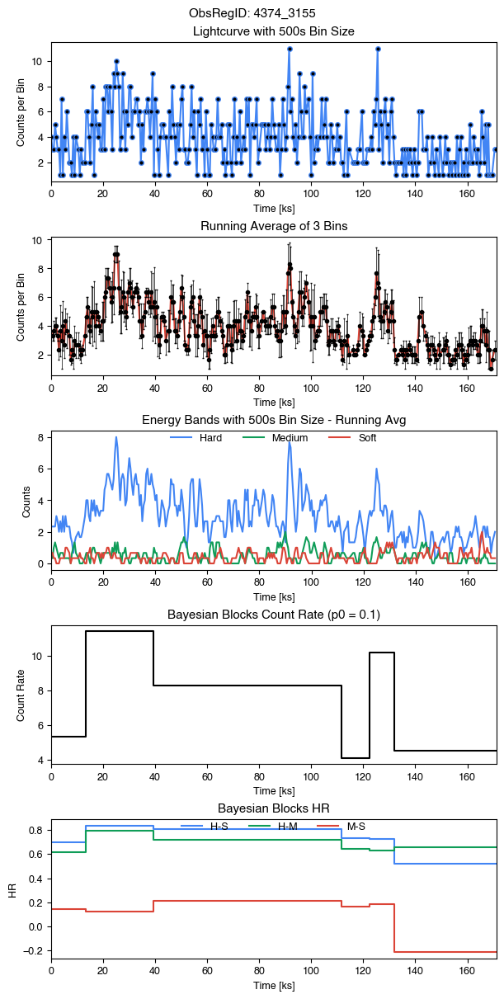

Name: 2CXO J053514.7-052229, ID: 4374-3297, Date: 2003-01-16T00:16:53, Counts: 1476
RA  83.81135879523731 DEC  -5.374931979983417
varB  0.94 varH  0.98 varM  0.32 varS  nan varINDEX  6.0


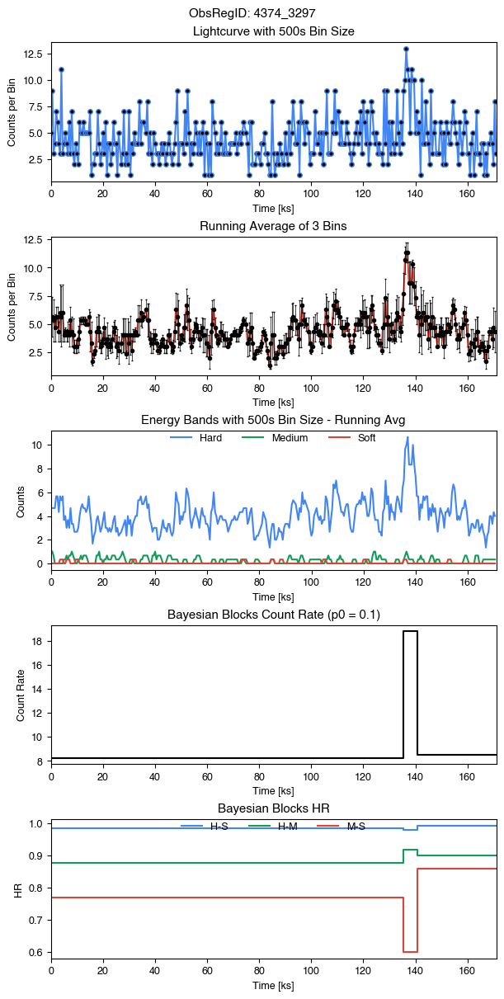

Name: 2CXO J053513.6-051954, ID: 4374-868, Date: 2003-01-16T00:16:53, Counts: 2758
RA  83.80675389866639 DEC  -5.33188393437455
varB  1.0 varH  0.99 varM  0.66 varS  0.09 varINDEX  8.0


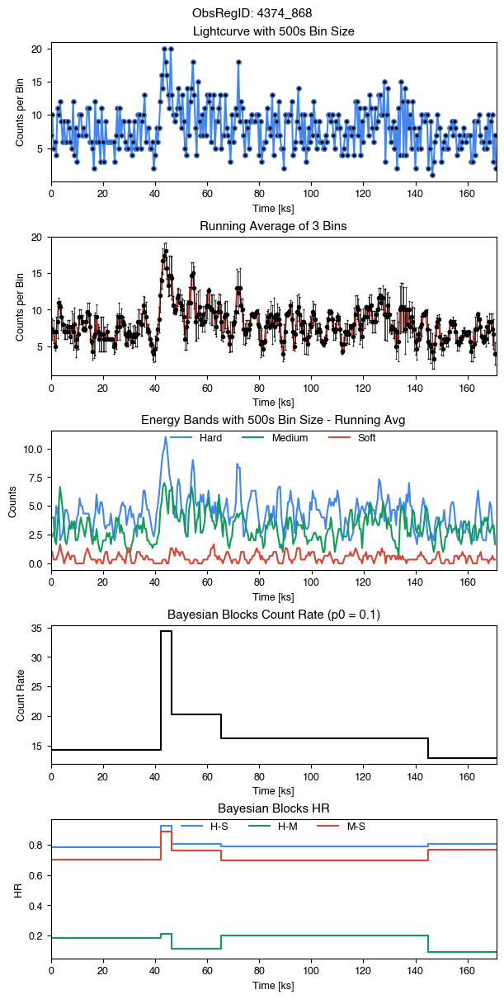

Name: 2CXO J053517.8-051835, ID: 4374-946, Date: 2003-01-16T00:16:53, Counts: 3088
RA  83.82454277924438 DEC  -5.3097755528494766
varB  1.0 varH  1.0 varM  1.0 varS  0.32 varINDEX  10.0


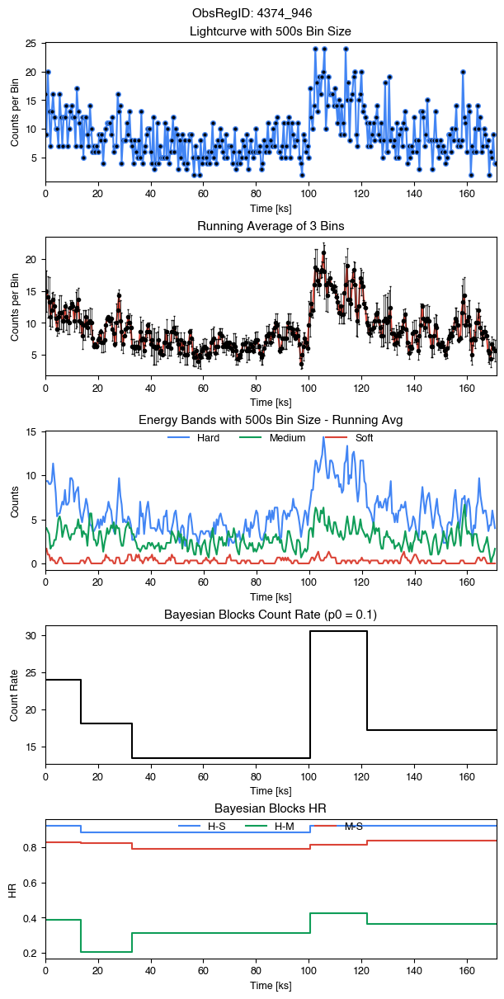

Name: 2CXO J053527.7-051804, ID: 4374-978, Date: 2003-01-16T00:16:53, Counts: 3287
RA  83.8656116812399 DEC  -5.301238643338194
varB  1.0 varH  1.0 varM  1.0 varS  0.49 varINDEX  9.0


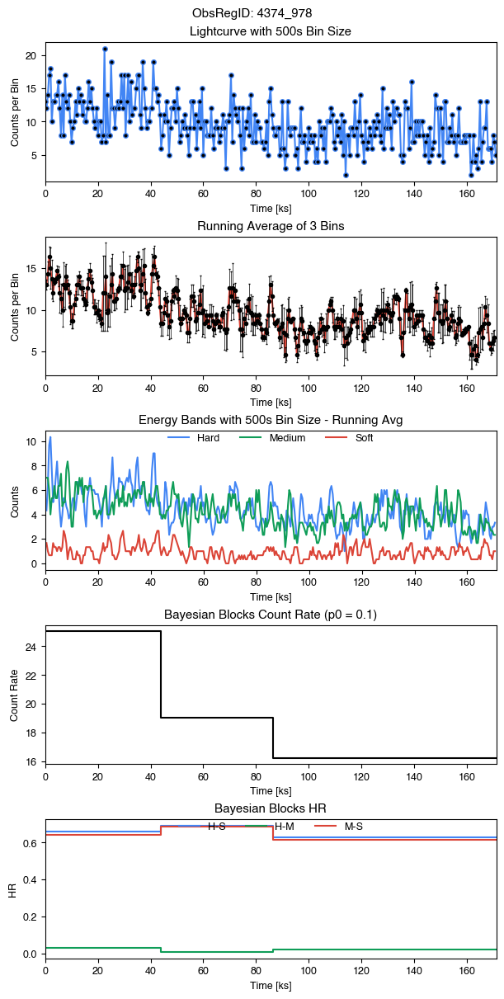

Name: 2CXO J053515.6-051746, ID: 4374-986, Date: 2003-01-16T00:16:53, Counts: 3224
RA  83.81529933133692 DEC  -5.296419701986912
varB  1.0 varH  1.0 varM  1.0 varS  0.64 varINDEX  10.0


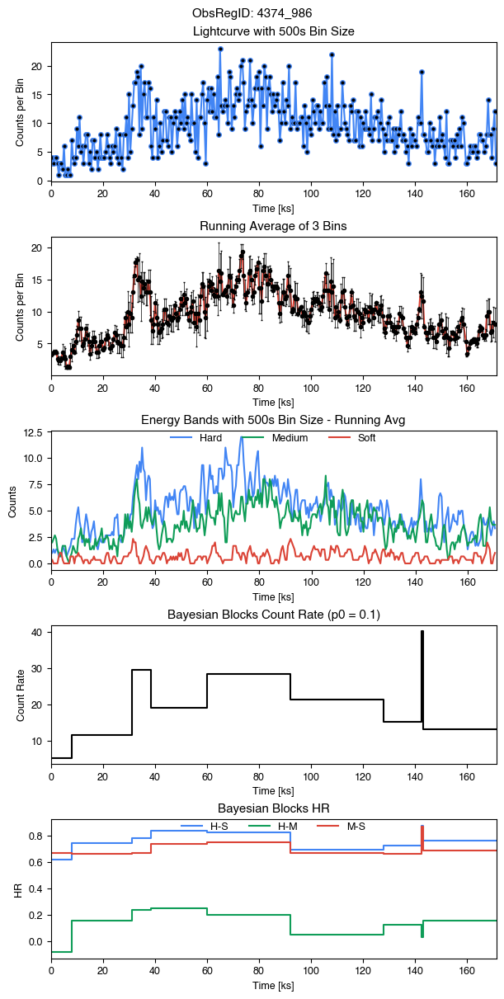

Name: 2CXO J053520.7-051548, ID: 4395-1042, Date: 2003-01-08T21:15:16, Counts: 3592
RA  83.83647724549638 DEC  -5.263640993356055
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


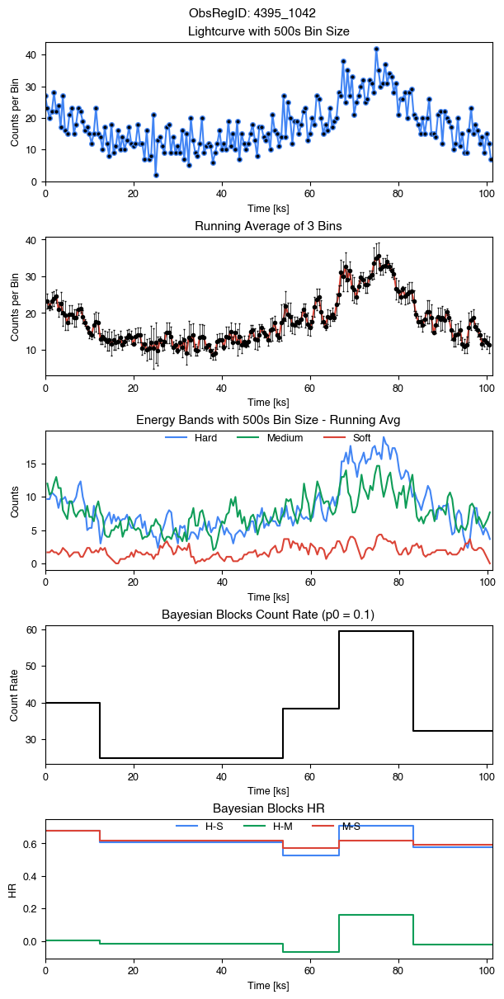

Name: 2CXO J053522.9-051744, ID: 4395-1494, Date: 2003-01-08T21:15:16, Counts: 2513
RA  83.84583069948383 DEC  -5.295799458164694
varB  1.0 varH  1.0 varM  1.0 varS  0.5 varINDEX  10.0


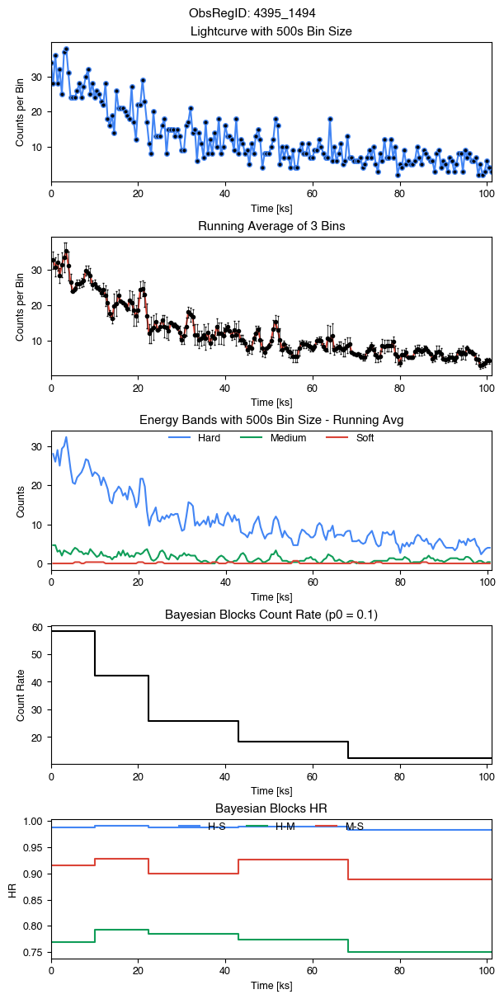

Name: 2CXO J053509.3-052141, ID: 4395-2427, Date: 2003-01-08T21:15:16, Counts: 1682
RA  83.78891138461563 DEC  -5.361549621536322
varB  1.0 varH  1.0 varM  1.0 varS  0.55 varINDEX  9.0


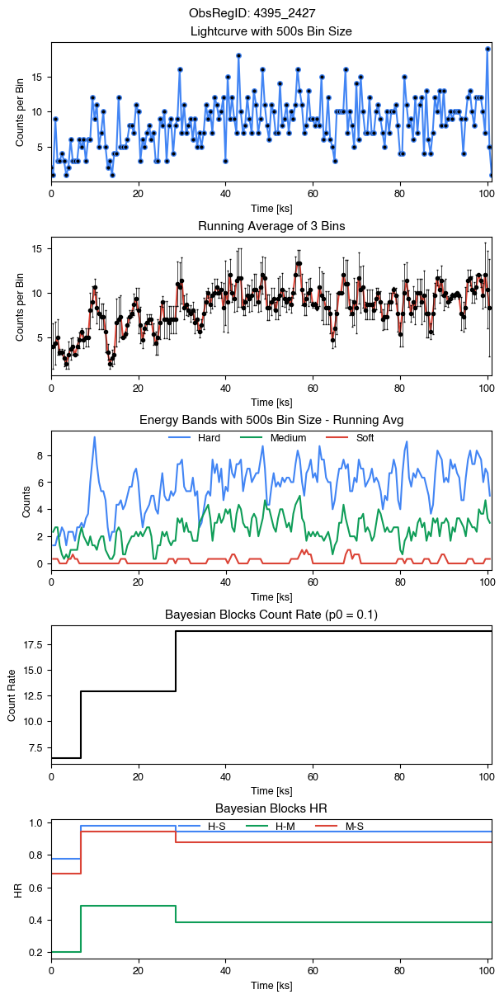

Name: 2CXO J053509.7-052128, ID: 4395-2620, Date: 2003-01-08T21:15:16, Counts: 2148
RA  83.79069585645362 DEC  -5.357863597589054
varB  1.0 varH  1.0 varM  0.34 varS  0.24 varINDEX  7.0


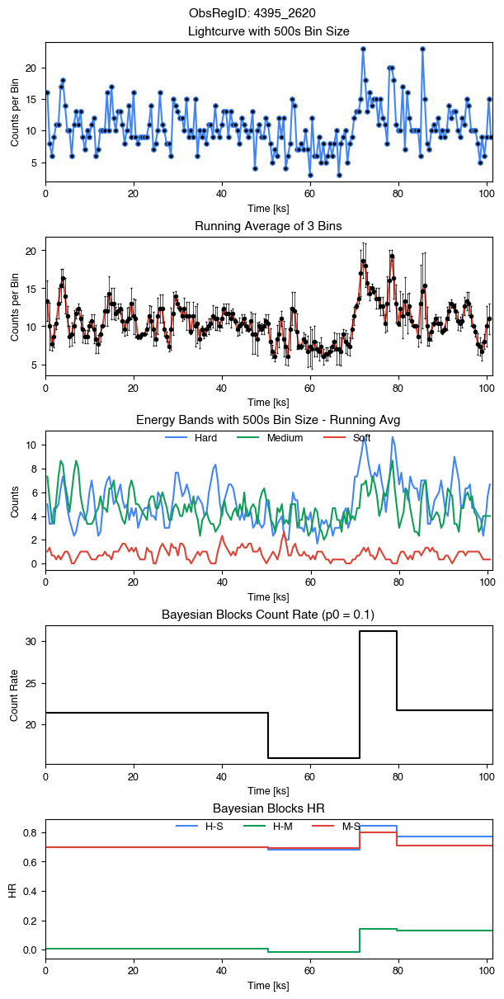

Name: 2CXO J053530.9-052201, ID: 4395-651, Date: 2003-01-08T21:15:16, Counts: 2645
RA  83.87914651565308 DEC  -5.367006680806345
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


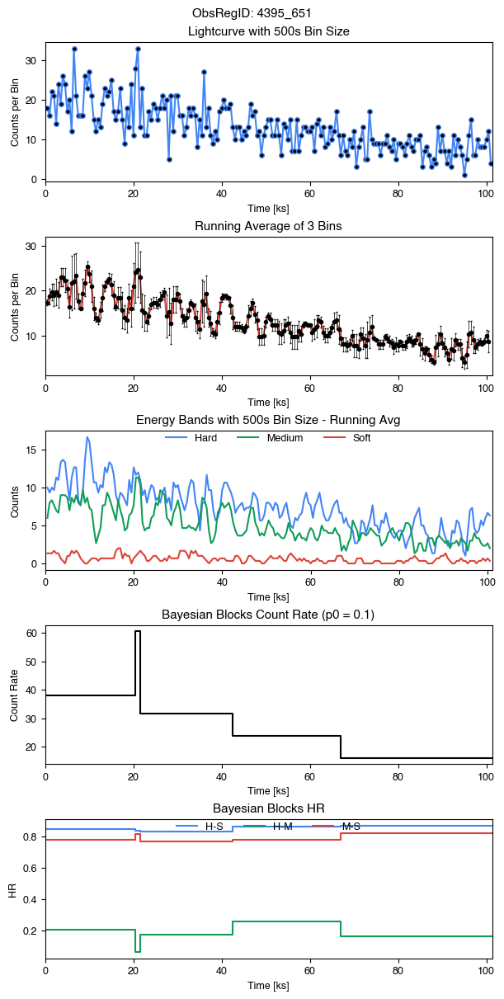

Name: 2CXO J053518.6-052033, ID: 4395-806, Date: 2003-01-08T21:15:16, Counts: 3403
RA  83.82777717591813 DEC  -5.342700639711149
varB  1.0 varH  1.0 varM  1.0 varS  0.04 varINDEX  10.0


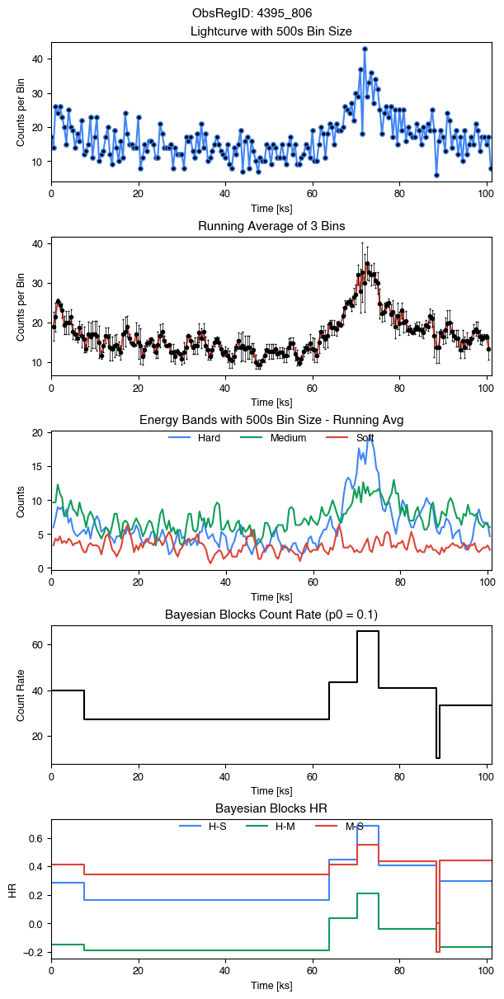

Name: 2CXO J053517.5-051739, ID: 4395-992, Date: 2003-01-08T21:15:16, Counts: 11018
RA  83.82299872943315 DEC  -5.2944278137694205
varB  1.0 varH  1.0 varM  1.0 varS  1.0 varINDEX  10.0


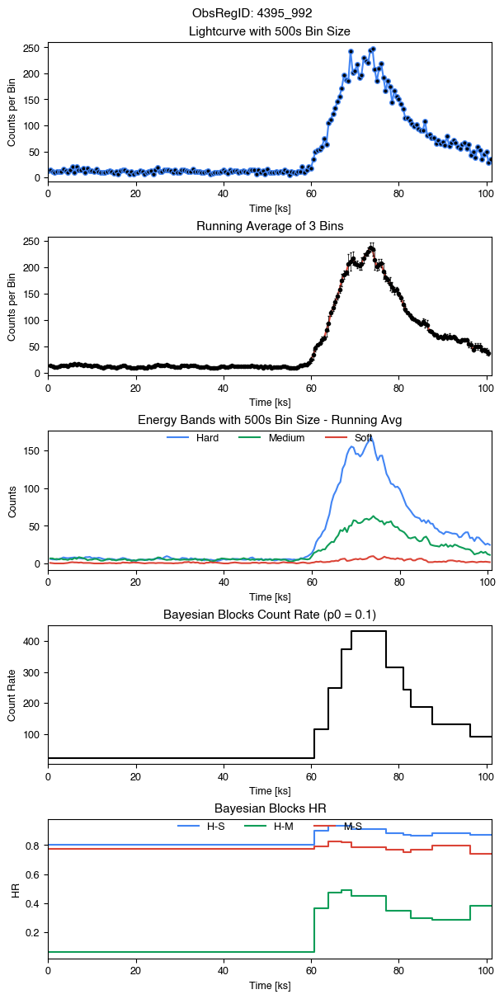

Name: 2CXO J053517.9-051613, ID: 4396-2208, Date: 2003-01-18T14:51:01, Counts: 2372
RA  83.8249471904196 DEC  -5.27038809718575
varB  1.0 varH  1.0 varM  0.13 varS  0.4 varINDEX  8.0


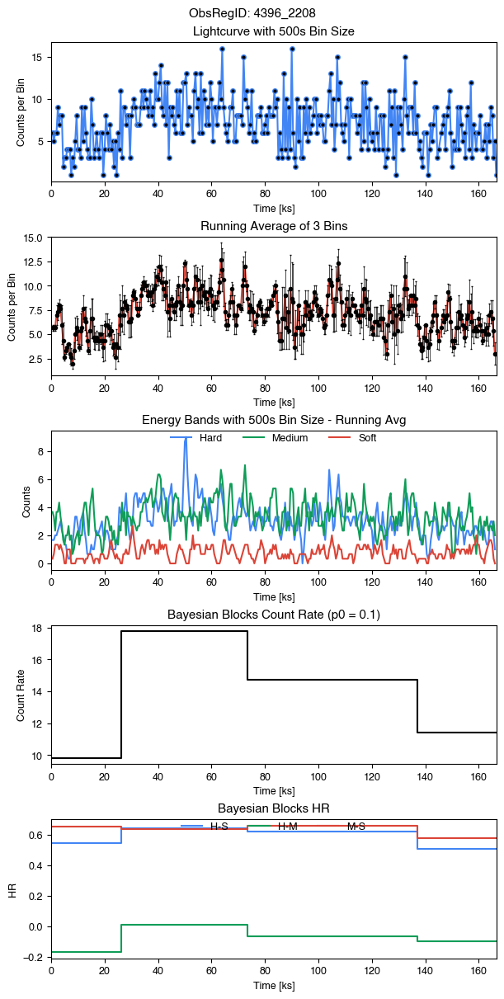

Name: 2CXO J053509.7-052128, ID: 4396-2620, Date: 2003-01-18T14:51:01, Counts: 2818
RA  83.79069585645362 DEC  -5.357863597589054
varB  1.0 varH  1.0 varM  0.02 varS  0.24 varINDEX  8.0


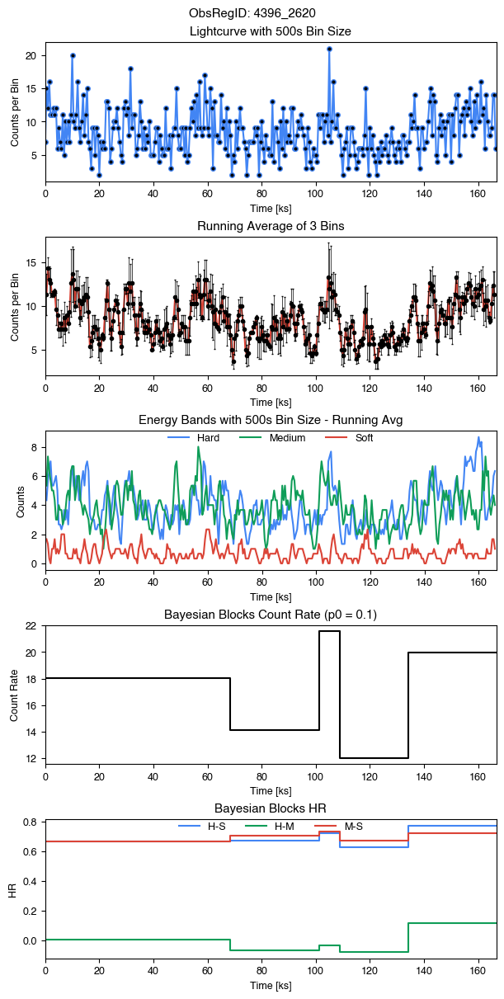

Name: 2CXO J053521.2-052159, ID: 4396-654, Date: 2003-01-18T14:51:01, Counts: 3422
RA  83.83842719034982 DEC  -5.3667031680879695
varB  1.0 varH  1.0 varM  1.0 varS  0.99 varINDEX  10.0


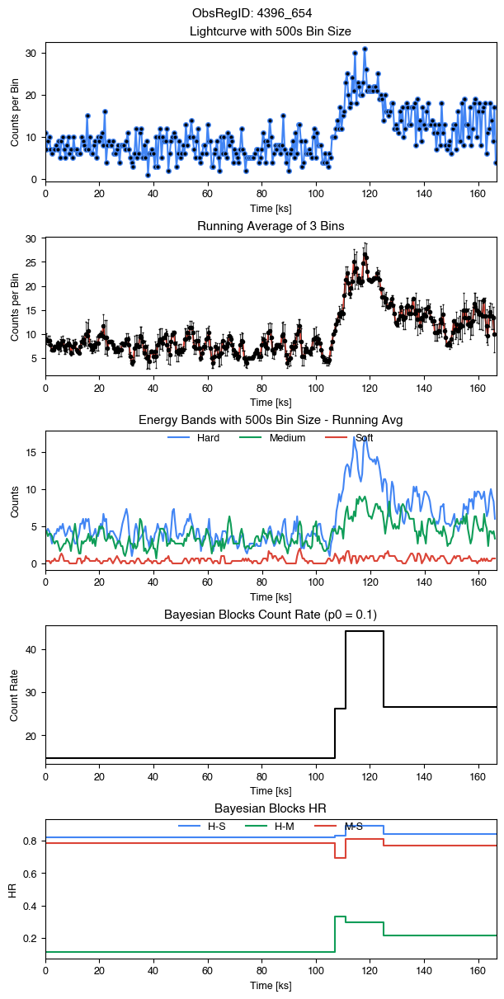

Name: 2CXO J184100.4-053547, ID: 4649-58, Date: 2004-05-12T10:00:42, Counts: 1419
RA  280.2517222261903 DEC  -5.59662862388826
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


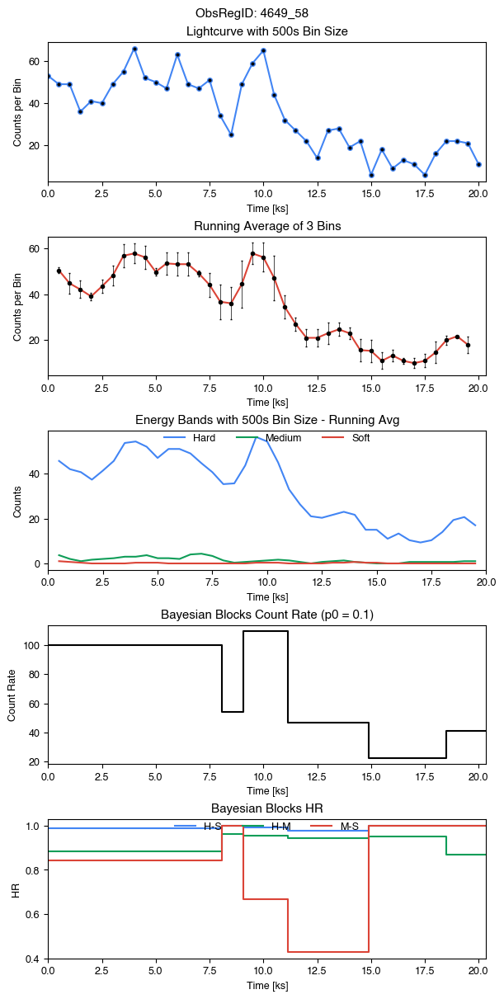

Name: 2CXO J122548.8+333248, ID: 5302-6, Date: 2004-04-11T01:27:07, Counts: 2431
RA  186.4534764296197 DEC  33.546820832459645
varB  1.0 varH  1.0 varM  1.0 varS  0.17 varINDEX  10.0


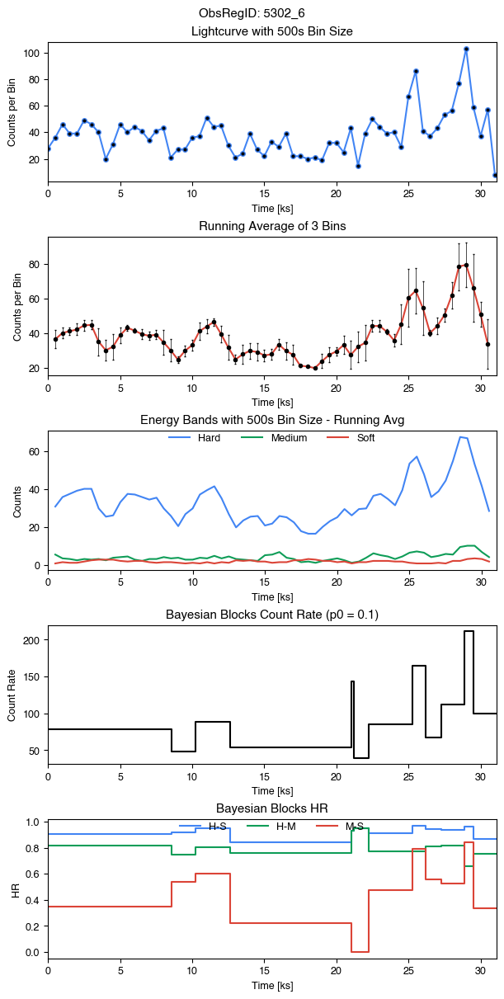

Name: 2CXO J043138.3+181357, ID: 5381-52, Date: 2005-10-27T12:06:55, Counts: 2298
RA  67.91006776024437 DEC  18.23257634344601
varB  0.98 varH  1.0 varM  0.86 varS  0.41 varINDEX  6.0


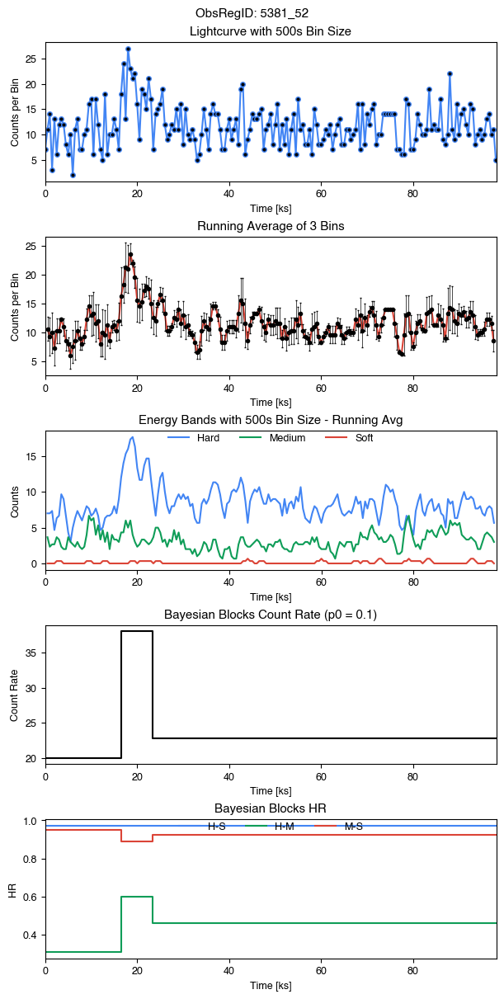

Name: 2CXO J022458.1+621401, ID: 5890-308, Date: 2005-01-04T09:09:06, Counts: 1785
RA  36.2422732359953 DEC  62.233880931109695
varB  0.99 varH  0.96 varM  0.17 varS  0.31 varINDEX  6.0


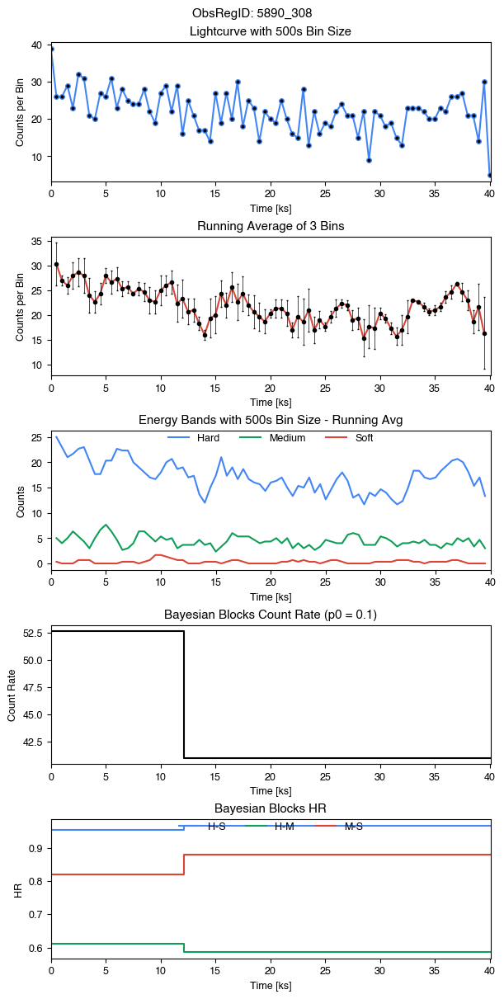

Name: 2CXO J022458.1+621401, ID: 5891-22, Date: 2005-07-17T15:09:37, Counts: 2396
RA  36.2422732359953 DEC  62.233880931109695
varB  1.0 varH  0.41 varM  0.99 varS  0.39 varINDEX  8.0


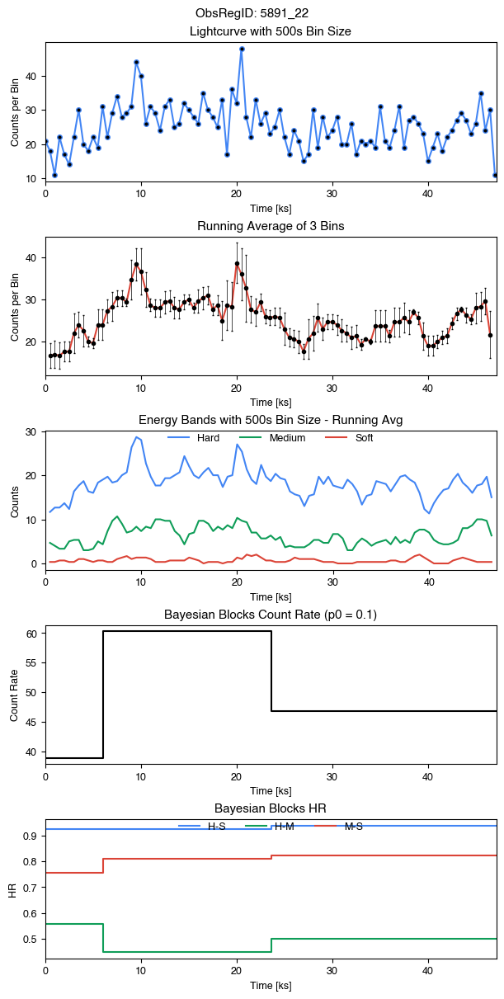

Name: 2CXO J162634.1-242328, ID: 635-121, Date: 2000-04-13T18:52:44, Counts: 2167
RA  246.6423763413187 DEC  -24.39133092934186
varB  1.0 varH  1.0 varM  1.0 varS  0.59 varINDEX  9.0


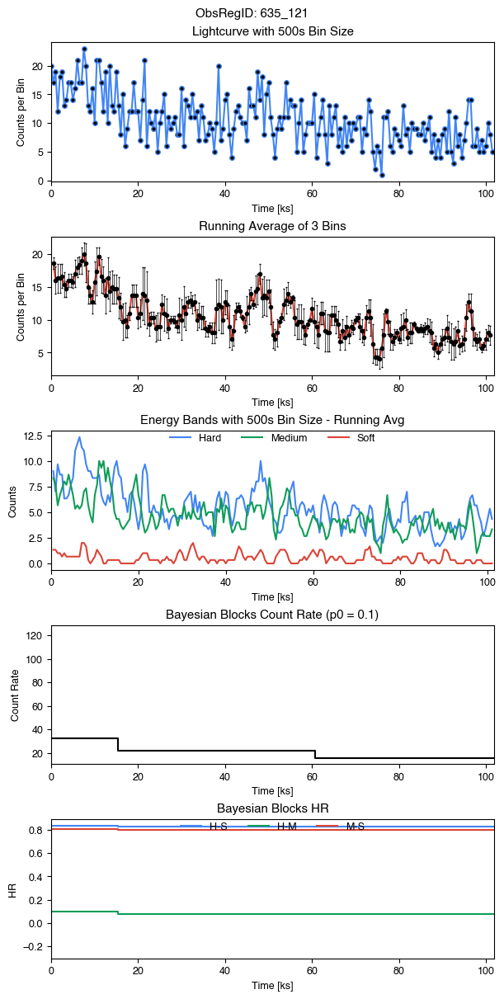

Name: 2CXO J162709.4-243719, ID: 635-80, Date: 2000-04-13T18:52:44, Counts: 979
RA  246.7892450685624 DEC  -24.622040145275204
varB  1.0 varH  1.0 varM  0.5 varS  nan varINDEX  10.0


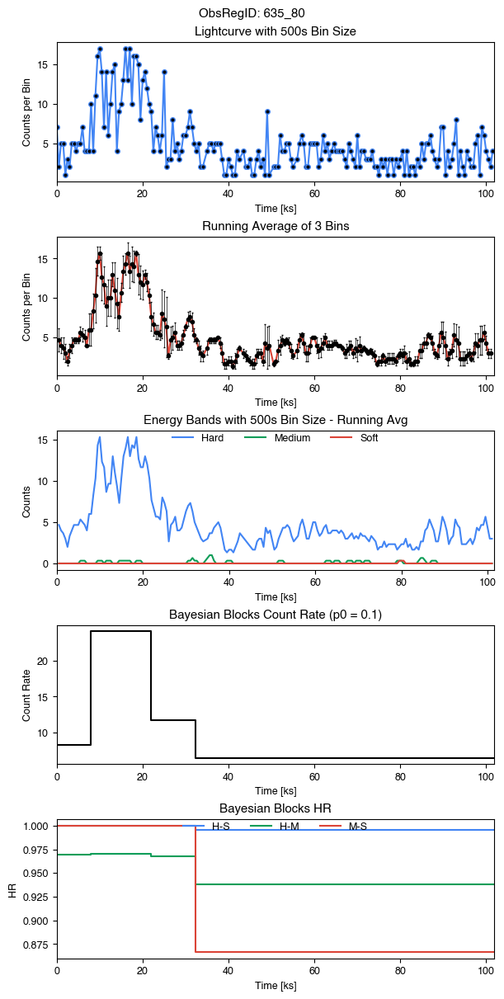

Name: 2CXO J162718.1-242852, ID: 635-93, Date: 2000-04-13T18:52:44, Counts: 1230
RA  246.8256270435488 DEC  -24.481401722055136
varB  1.0 varH  1.0 varM  0.2 varS  nan varINDEX  10.0


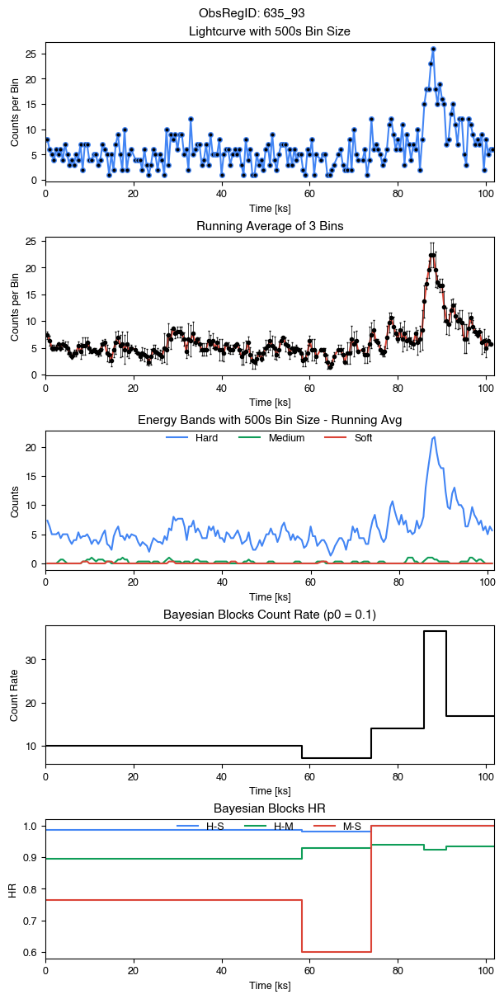

Name: 2CXO J162622.3-242253, ID: 635-96, Date: 2000-04-13T18:52:44, Counts: 6649
RA  246.59330229401792 DEC  -24.381530843078124
varB  1.0 varH  1.0 varM  1.0 varS  0.99 varINDEX  10.0


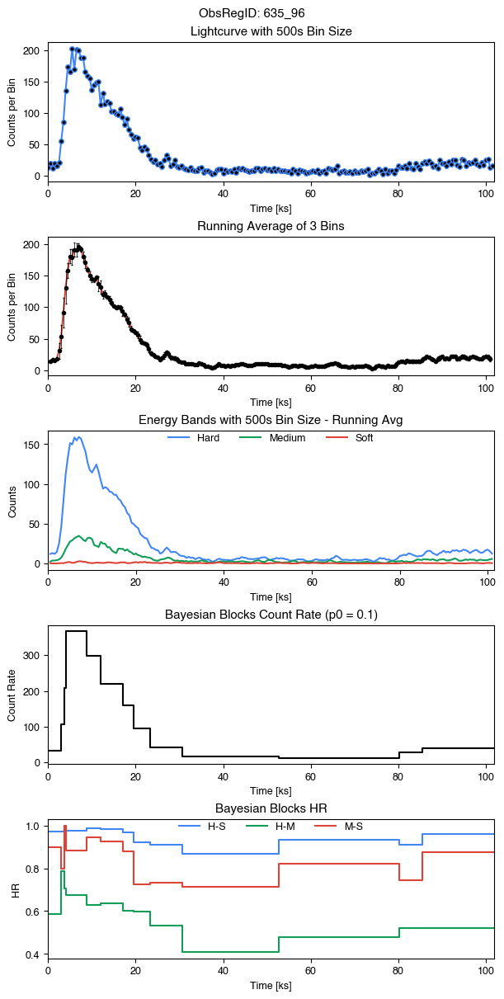

Name: 2CXO J054553.6+002526, ID: 7417-105, Date: 2007-11-06T20:01:58, Counts: 2785
RA  86.47339124711414 DEC  0.4241220364102478
varB  0.99 varH  0.98 varM  0.09 varS  nan varINDEX  7.0


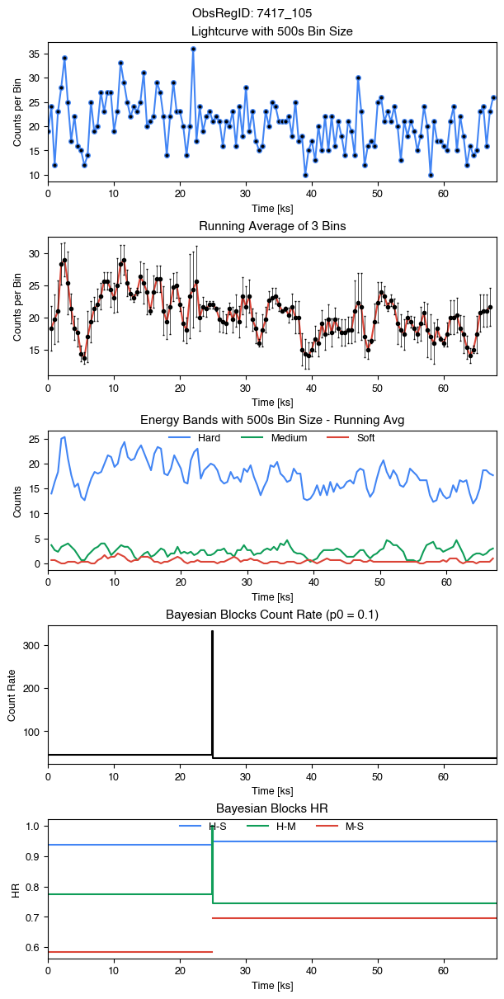

Name: 2CXO J174041.6-534019, ID: 7460-88, Date: 2007-07-16T06:46:56, Counts: 3554
RA  265.17335844384104 DEC  -53.67208449739255
varB  1.0 varH  0.77 varM  1.0 varS  0.92 varINDEX  9.0


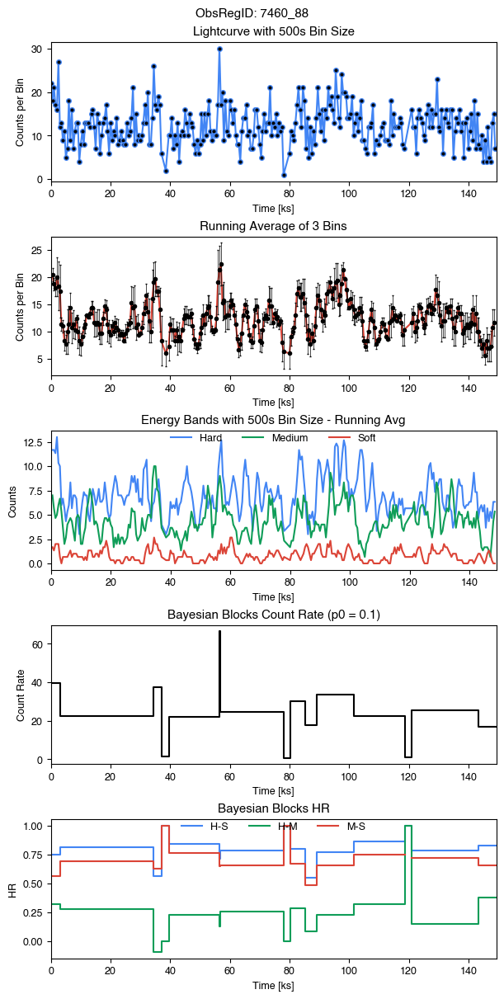

Name: 2CXO J225355.0+624337, ID: 9920-192, Date: 2009-04-16T11:09:14, Counts: 1854
RA  343.4794455882512 DEC  62.72695832664228
varB  1.0 varH  1.0 varM  0.07 varS  0.29 varINDEX  7.0


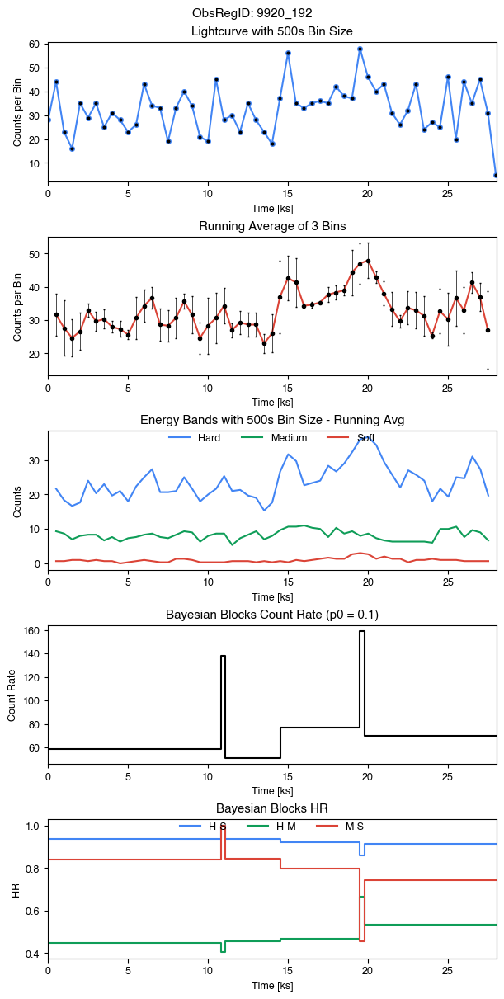

In [118]:
# ###
# df_properties_anomalies = df_properties_anomalies2 # comment out for clusters
# df_select = points_in_box# comment out for clusters
df_properties_anomalies = df_properties_anomalies[df_properties_anomalies['var_index_b']>5] #COMMENT OUT
potential_anomalies = df_properties_anomalies['obsreg_id']
# potential_anomalies = df_select['obsreg_id']
print(len(potential_anomalies))
keep = potential_anomalies.values[0:]


# keep = ['13814_86','2540_253','633_2117']
# keep = ['6442_37','11231_250','5424_145','16000_221']
# keep = ['3012_53','3744_830','4373_662','4396_2625','13117_169','13653_40','6291_253']
# keep = ['12330_2071','10135_343','11073_116','11073_116','13951_16']
# keep = potential_anomalies.values
# keep = ['9912_482']
years = range(1999,2023)
# Image producer
# keep = all_ids[50000:55000]
df_eventfiles_group_filtered = df_eventfiles_group.filter(lambda x: x.name in keep).groupby('obsreg_id')
for id_name, dfi in df_eventfiles_group_filtered:
    dfi.sort_values(by='time', inplace = True) 
    dfi.reset_index(drop=True, inplace = True)
    obsid = id_name.split("_")[0]
    regionid = id_name.split("_")[1]
    # Get property columns
    name = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].name.values[0]
    ra = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].ra.values[0]
    dec = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].dec.values[0]
    date = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].gti_obs.values[0] 
    var_prob_b = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].var_prob_b.values[0]
    var_prob_h = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].var_prob_h.values[0]
    var_prob_m = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].var_prob_m.values[0]
    var_prob_s = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].var_prob_s.values[0] 
    var_index_b = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].var_index_b.values[0]
    # Get spectrum
    # pha_filename = [spec for spec in glob.iglob(f'{pha_folder}/acisf*pha3.fits.gz') if str(obsid) in spec and str(regionid) in spec][0]
    # ui.load_pha(pha_filename)
    # ui.ignore('0.:0.5,8.0:')
    # ui.subtract()
    # ui.notice_id(1,0.3,7.)
    # ui.group_counts(10)
    # ui.set_ylog()
    # ui.set_xlog()
    # ui.plot_data(color='red')
    # plt.xlim(1E-1,10)  
    # plt.show(

    if any(str(year) in date for year in years):
        print(f'Name: {name}, ID: {obsid}-{regionid}, Date: {date}, Counts: {len(dfi)}')
        print('RA ', str(ra), 'DEC ', str(dec))
        print('varB ', str(round(var_prob_b,2)), 'varH ', str(round(var_prob_h,2)),'varM ', str(round(var_prob_m,2)),'varS ', str(round(var_prob_s,2)),'varINDEX ', str(var_index_b))
        lightcurveplotterNEW(dfi,id_name,500,bb_p0=0.1,band_errors=False)
        # lightcurveplotterNEW(dfi,id_name,len(dfi)/100,bb_p0=0.1,band_errors=False)
    else:
        pass
    # # hist2D(dfi,id_name,16,24,'minmax',True,'plasma',lognorm=True)
    # # hist2D(dfi,id_name,16,24,'minmax',True,'plasma',lognorm=False)
    # hist3D(dfi,id_name,16,24,24,'minmax',True,'plasma',lognorm=True)
    #hist3D(dfi,id_name,16,24,24,'minmax',True,'plasma',lognorm=False)
    # hist3Dlog(dfi,id_name,16,24,24,'minmax',True,'plasma')

In [65]:
potential_anomalies = df_properties_anomalies['obsreg_id']
df_properties_anomalies = df_properties_global[df_properties_global['obsreg_id'].isin(potential_anomalies)]
# keep = ['13814_86','2540_253','633_2117']
keep = ['4373_704','17196_22']
keep = potential_anomalies
keep = ['4373_704','17196_22','5322_229']
df_properties_anomalies = df_properties_global[df_properties_global['obsreg_id'].isin(keep)]
df_properties_anomalies.head(500)

,name,ra,dec,err_ellipse_r0,err_ellipse_r1,err_ellipse_ang,significance,likelihood_class,conf_flag,sat_src_flag,...,hard_hs_hilim,var_prob_b,var_prob_h,var_prob_m,var_prob_s,var_index_b,var_index_w,livetime,detector,obsreg_id
33394,2CXO J053524.1-052132,83.850449,-5.359066,0.711036,0.710252,98.802834,37.030891,TRUE,False,False,...,-0.347908,1.0,1.000000,1.000000,1.000000,10.0,NaN,171465.489393,ACIS-3,4373_704
77440,2CXO J131531.7-162723,198.882148,-16.456599,0.710691,0.710518,158.198352,50.785932,TRUE,False,False,...,-0.883823,1.0,1.000000,1.000000,1.000000,10.0,NaN,88865.338014,ACIS-6,17196_22
84683,2CXO J140414.2+542604,211.059111,54.434571,0.711382,0.710545,58.332784,72.109780,TRUE,True,False,...,-0.576515,1.0,0.163951,0.841169,0.117768,8.0,NaN,64696.624674,ACIS-8,5322_229


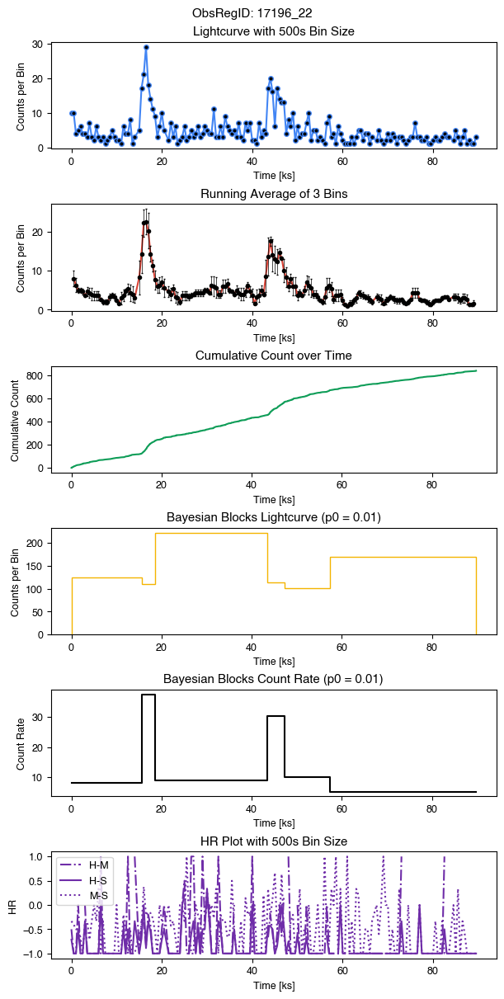

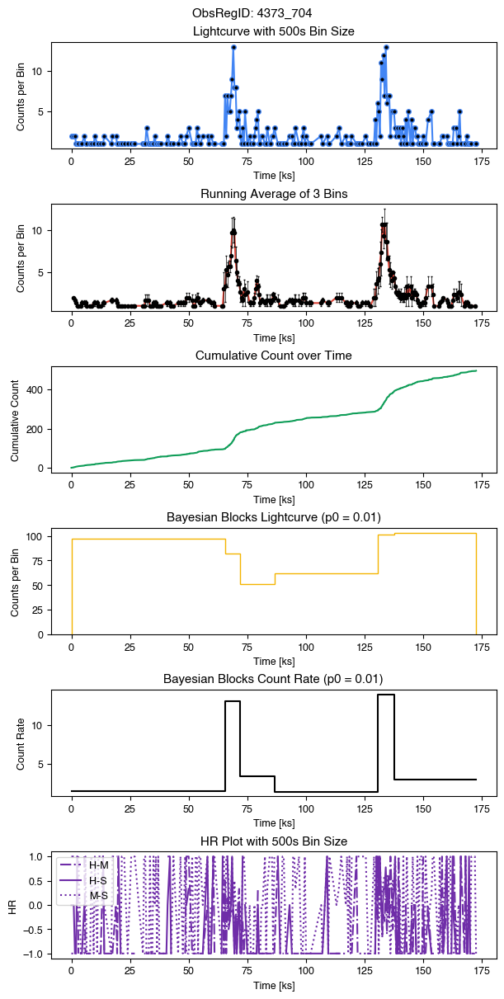

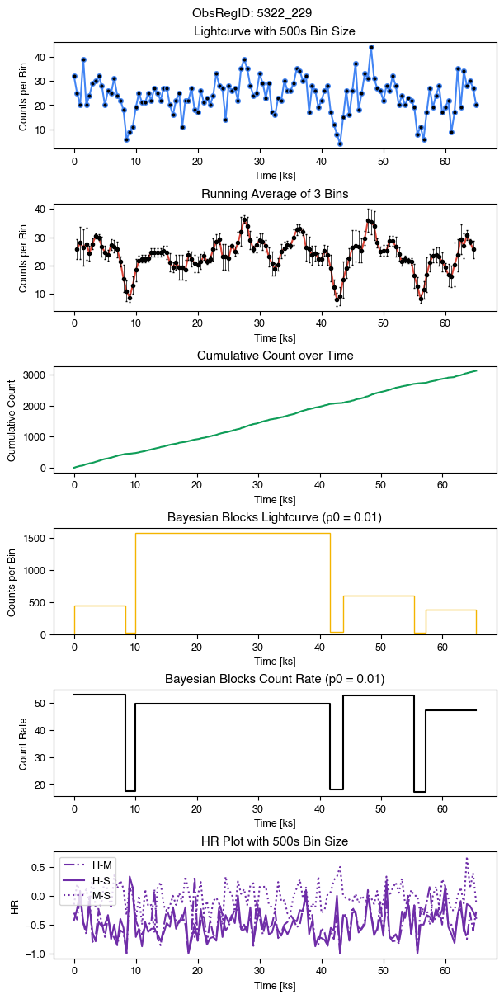

In [66]:
df_eventfiles_group_filtered = df_eventfiles_group.filter(lambda x: x.name in keep).groupby('obsreg_id')
for id_name, dfi in df_eventfiles_group_filtered:
    dfi.sort_values(by='time', inplace = True) 
    dfi.reset_index(drop=True, inplace = True)
    lightcurveplotter(dfi,id_name,500,bb_p0=0.01)